# **SmartSeq**

## MCF7

### Exploratory data analysis and Data cleaning


We start by loading the necessary libraries and load the first two datasets from our drive. Please notice that you'll need to change it, in order to match it with the path to the file on your local machine.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
import seaborn as sns
import random

In [ ]:
unfilt = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Unfiltered_Data.txt', delimiter = " ", index_col = 0)
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)

We now see how the data is stored in these tables, looking at the first entries:

The first showed is the meta file, containing useful informations about the experiment, in particular the column `Condition` indicates the condition in which the cell grew up.



In [ ]:
meta

,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
...,...,...,...,...,...,...,...,...
output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.4,H5,Norm,72,S359,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.4,H6,Norm,72,S360,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.4,H7,Hypo,72,S379,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


The second is the actual table containig the read counts as described above

In [ ]:
print("The dimension of this dataset is:", unfilt.shape,"\n")
unfilt

The dimension of this dataset is: (22934, 383) 



,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,0,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,0,0,1,10,1,0,0,...,1,1,0,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4,0,0,0,3,3,0,0,14,1,...,0,4,12,4,0,1,6,0,7,4
MT-CYB,270,1,76,66,727,2717,9326,3253,7949,30,...,239,3795,12761,2263,1368,570,3477,349,2184,1149
MT-TT,0,0,0,0,0,1,1,1,4,0,...,0,7,4,2,0,0,3,0,2,2
MT-TP,5,0,0,1,0,1,1,4,2,0,...,0,14,56,11,2,0,7,2,28,11


We can first check if the data type is always the same across the features in the dataframe

In [ ]:
assert [unfilt.T.dtypes[i] == 'int64' for i in range(len(unfilt.dtypes))]
#And this is the case

First of all we want to see if there'are some missing value in the dataset. This is a standard operation that we want to do on a dataset, because if there are some missing entries we will have to deal with them somehow

In [ ]:
unfilt.isnull().sum(axis = 1).sum(axis = 0)
#Luckly enough there are not :)

0

Another standard procedure is the one to look for duplicate values among the features in our table. As pointed out in the suggestion notebook this could be due to many reasons: redundancy in gene annotation, overlapping of gene annotation on the same region, etc...

In [ ]:
dup_rows_unfilt = unfilt[unfilt.duplicated(keep=False)]
print("The number of duplicate rows is", dup_rows_unfilt.shape[0])

The number of duplicate rows is 56


Yes, we have duplicate rows. Our task now will be first to understand which line is equal to which other line(s) in the data. To do that we can simply start by building a correlation matrix of these duplicate genes.

In [ ]:
dup_rows_corr = dup_rows_unfilt.T.corr()
dup_rows_corr

,SHISAL2A,IL12RB2,S1PR1,CD84,GNLY,FAR2P3,KLF2P3,PABPC1P2,UGT1A8,UGT1A9,...,BCL6B,CCL3L3,CCL3L1,OTOP3,RNA5SP450,PSG1,MIR3190,MIR3191,SEZ6L,ADAMTS5
SHISAL2A,1.000000,0.630630,0.654887,0.312826,0.497375,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.630630
IL12RB2,0.630630,1.000000,0.829681,0.799056,0.630630,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.630630,-0.007222,-0.007222,0.612365,-0.004979,0.630630,-0.004979,-0.004979,0.586533,0.799056
S1PR1,0.654887,0.829681,1.000000,0.412553,0.654887,-0.007656,-0.007656,0.654887,-0.008565,-0.008565,...,0.654887,-0.006996,-0.006996,0.178813,-0.004823,0.654887,-0.004823,-0.004823,0.149322,0.829681
CD84,0.312826,0.799056,0.412553,1.000000,0.312826,-0.007903,-0.007903,0.948434,-0.008841,-0.008841,...,0.312826,-0.007222,-0.007222,0.964653,-0.004979,0.312826,-0.004979,-0.004979,0.955646,0.397167
GNLY,0.497375,0.630630,0.654887,0.312826,1.000000,-0.008333,-0.008333,0.497375,-0.009322,-0.009322,...,1.000000,0.021357,0.021357,0.134926,-0.005249,0.497375,-0.005249,-0.005249,0.112487,0.948434
FAR2P3,-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
KLF2P3,-0.008333,-0.007903,-0.007656,-0.007903,-0.008333,1.000000,1.000000,-0.008333,-0.014798,-0.014798,...,-0.008333,-0.012088,-0.012088,-0.006928,-0.008333,-0.008333,-0.008333,-0.008333,-0.006775,-0.007903
PABPC1P2,0.497375,0.948434,0.654887,0.948434,0.497375,-0.008333,-0.008333,1.000000,-0.009322,-0.009322,...,0.497375,-0.007615,-0.007615,0.831379,-0.005249,0.497375,-0.005249,-0.005249,0.813013,0.630630
UGT1A8,-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841
UGT1A9,-0.009322,-0.008841,-0.008565,-0.008841,-0.009322,-0.014798,-0.014798,-0.009322,1.000000,1.000000,...,-0.009322,-0.013523,-0.013523,-0.007750,-0.009322,-0.009322,-0.009322,-0.009322,-0.007579,-0.008841


Now we save a dict with a key for every gene and with value a list containig all the other genes with which it is identically expressed. This is needed since we need to keep track of this when deleting duplicate genes to avoid baias in the analysis.

We will build this dictionary starting from the table above and scanning through each column checking if there's a 1 that is not representing the correlation of a gene with itself. If it's the case, we will add the gene to the corresponding list

In [ ]:
dup_dict = {}

for col in dup_rows_corr.columns:
  for row in dup_rows_corr.index:
    if (dup_rows_corr.loc[row, col] == 1 and row != col):
      if row not in dup_dict:
        dup_dict[row] = []
      dup_dict[row].append(col)

dup_dict

{'ADAMTS5': ['LINC02183'],
 'ASPA': ['MT1M'],
 'BCL6B': ['GNLY', 'KCNS2'],
 'CACYBPP1': ['MTCO2P11'],
 'CCL3L1': ['CCL3L3'],
 'CCL3L3': ['CCL3L1'],
 'CD84': ['WDR95P'],
 'CLCN3P1': ['OTOP3'],
 'COQ10BP2': ['SHISAL2A'],
 'CSMD1': ['SEZ6L'],
 'FAR2P3': ['KLF2P3'],
 'GALNT17': ['IL12RB2', 'PON1'],
 'GNLY': ['KCNS2', 'BCL6B'],
 'HTR5A': ['RNU6-539P'],
 'IL12RB2': ['GALNT17', 'PON1'],
 'KCNS2': ['GNLY', 'BCL6B'],
 'KLF2P3': ['FAR2P3'],
 'KNOP1P1': ['LINC00477'],
 'LAP3P2': ['PANDAR'],
 'LINC00477': ['KNOP1P1'],
 'LINC00595': ['LINC00856'],
 'LINC00856': ['LINC00595'],
 'LINC02183': ['ADAMTS5'],
 'MIR19B1': ['MIR20A'],
 'MIR20A': ['MIR19B1'],
 'MIR3190': ['MIR3191'],
 'MIR3191': ['MIR3190'],
 'MIR548AA1': ['MIR548D1'],
 'MIR548D1': ['MIR548AA1'],
 'MIR664B': ['SNORA36A'],
 'MT1M': ['ASPA'],
 'MTCO2P11': ['CACYBPP1'],
 'MUC6': ['S1PR1'],
 'OTOP3': ['CLCN3P1'],
 'PABPC1P2': ['SLC22A14'],
 'PANDAR': ['LAP3P2'],
 'PON1': ['IL12RB2', 'GALNT17'],
 'PSG1': ['VSTM4'],
 'RBFOX1': ['RPL21P5'],
 'RNA5S

In [ ]:
#Here we drop the diplicate genes that we recorded
unfilt = unfilt.copy().drop_duplicates()

---
Now we turn our attention to the study of the correlation between cells. In principle, given the fact that every gene expression in the table is coming from the same cell line we expect overall an high correlation among them.

Average correlation between cells:  0.49898217617448165
Minimum correlation between cells:  -0.002035647651036618 



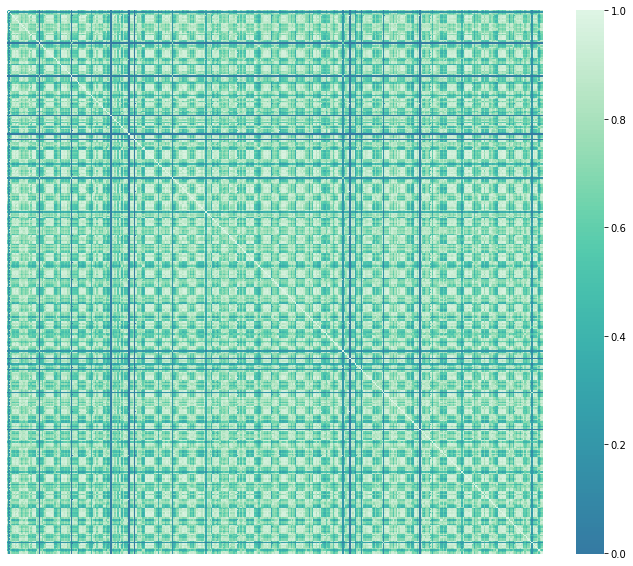

In [ ]:
plt.figure(figsize=(12,10))

corr = unfilt.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()

sns.heatmap(corr,cmap="mako", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

We can see from the minimum value obtained that there are some cells that are completely uncorrelated from the others and we want to see why:

Text(0, 0.5, 'Frequency')

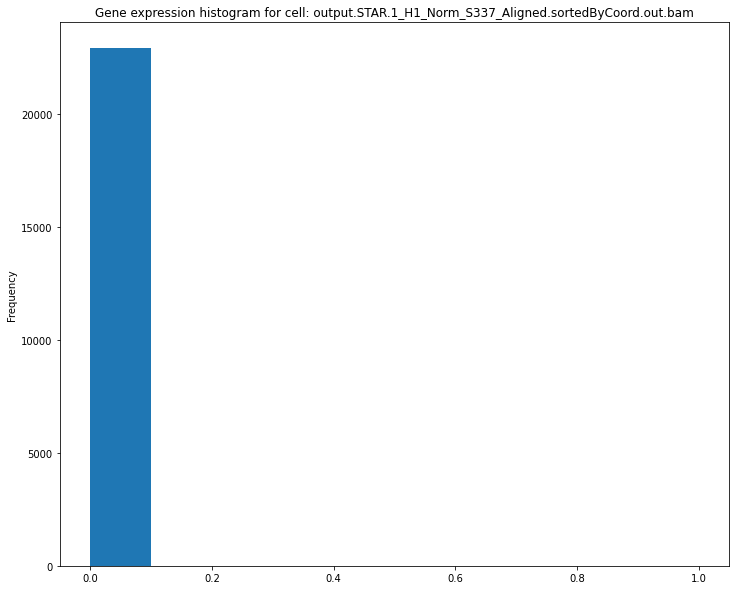

In [ ]:
plt.figure(figsize=(12,10))
#Given the symmetry of the table i look for low correlated cells in the first column, but
#that's completely arbirary
min  = np.argmin(list(corr['output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam']))
plt.hist(unfilt.iloc[:,min])
plt.title(f"Gene expression histogram for cell: {unfilt.columns.values[min]}")
plt.ylabel("Frequency")

Here we can clearly see why. These cells have zero count for every gene. These cells are abnormal and therefore will need to be removed. We will treat this issue in full details in the part concerning filtering

We now want to analyse the structure among the covariates. Notice that here due to computational power issues we display the correlation just of the first 10% of the genes.

Average correlation between cells:  0.3475550350017191
Minimum correlation between cells:  -0.3048899299965619 



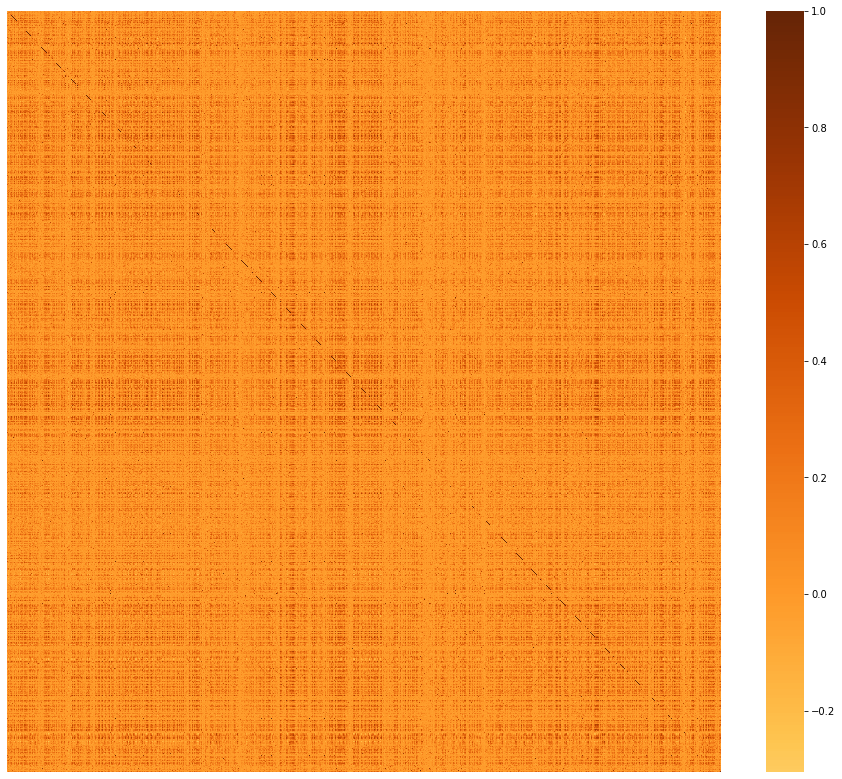

In [ ]:
plt.figure(figsize=(16,14))
#df_small = df.iloc[:, :50]
#c= df_small.corr()
corr = unfilt.iloc[:3000,:].T.corr()
midpoint = (corr.values.max() - corr.values.min()) /2 + corr.values.min()
#sns.heatmap(c,cmap='coolwarm',annot=True, center=midpoint )
sns.heatmap(corr,cmap="YlOrBr", center=0, yticklabels=False , xticklabels=False)

print("Average correlation between cells: ", midpoint)
print("Minimum correlation between cells: ", corr.values.min(), "\n")

Even if we are dealing with just the 10% of the data we can clearly see how there's not a well defined structure among the genes. This can be paroblem if we consider the dimension of the dataset, some more structure for sure would have helped us in dimensionality reduction, for example, or in the task to find the so called "meta-genes".


---

Given what we've seen in the table `unfilt` we suspect that our dataset will be probably very sparsed, so we want to quantify that sparsity in some way. The first and more intutive one is to calculate the average sparsity and to plot the table in some way



In [ ]:
#Avarage density of zeros in the data

print(f"The average sparsity of the table is: {(unfilt == 0).sum().sum() / (unfilt.shape[0] * unfilt.shape[1]) * 100}%")

The average sparsity of the table is: 60.16711094696393%


This is a pretty high value! our dataset is definitely sparsed.

In the following plot we color with blue the points in the table that are different from zero. This can give us an idea of how this high sparsity is distributed across the dataset

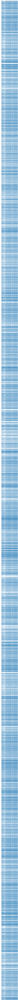

In [ ]:
plt.figure(figsize=(25, 600))
plt.spy(unfilt.iloc[:, :], markersize=1)

This very big graph is already telling us some interesting things about the data.

We can clearily see that some cells have a low overall number of genes expessed and this may be due to problems of measure, health of the single cell, lab mistakes, ecc...

At the same time we observe how some genes are constantly not expressed among almost all the cells, meaning that there is no need of producing that specific protein / activating that methabolic pathway / regulating that specific gene expression that the gene is encodning for .

Gene expression is thus inducing non homogeneity of the sparsity. This is actually a good thing! This sparsity is "well structured and it brings a biological meaning"! (clearily veasible some horizontal white lines). Our aim will be therefore to study this structure and drive our own conclusions from that.

The great limitation of this plot is that we don't have a differentiation among values of the expression (but we will have a more complete picture with an heatmap leater), to have an idea of that we use the function `describe()` on our dataset and we plot an histogram of the expression for some randomly choosen cells

In [ ]:
unfilt.describe()

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_A7_Hypo_S25_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H2_Norm_S356_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
count,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,...,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000,22905.000000
mean,40.869330,0.012268,86.549356,1.025933,14.549749,56.284741,75.492556,62.847195,67.482078,2.243571,...,17.384545,42.133508,34.736302,32.775682,22.020563,17.461209,49.305086,61.623226,68.375769,62.930976
std,466.002411,0.207857,1037.224285,6.101112,123.877800,503.913891,430.735604,520.491980,459.973686,25.465612,...,193.275011,256.933843,680.390121,300.478924,153.536760,198.304138,359.560626,541.185241,637.290526,786.164389
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,17.000000,0.000000,5.000000,0.000000,7.000000,23.000000,39.000000,35.000000,38.000000,1.000000,...,9.000000,30.000000,0.000000,17.000000,12.000000,9.000000,27.000000,30.000000,38.000000,33.000000
max,46744.000000,14.000000,82047.000000,289.000000,10582.000000,46856.000000,29534.000000,50972.000000,36236.000000,1707.000000,...,17800.000000,23355.000000,81952.000000,29540.000000,12149.000000,19285.000000,28021.000000,40708.000000,46261.000000,68790.000000


Text(0, 0.5, 'Frequency')

<Figure size 1440x1224 with 0 Axes>

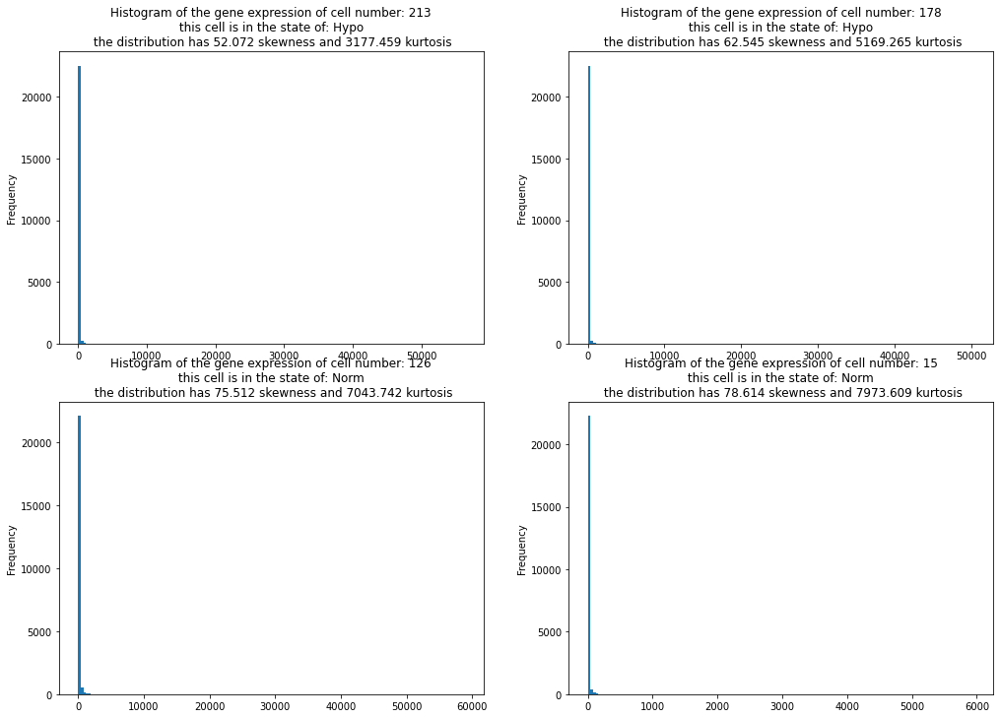

In [ ]:
from scipy.stats import kurtosis, skew

plt.figure(figsize=(20, 17))

first_cell = random.randrange(unfilt.shape[1])
second_cell = random.randrange(unfilt.shape[1])
third_cell = random.randrange(unfilt.shape[1])
fourth_cell = random.randrange(unfilt.shape[1])

plt.figure(figsize=(17, 12))

plt.subplot(2, 2, 1)
plt.hist(unfilt.iloc[:,first_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {first_cell}\n this cell is in the state of: {meta.iloc[first_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,first_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,first_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 2)
plt.hist(unfilt.iloc[:,second_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {second_cell}\n this cell is in the state of: {meta.iloc[second_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,second_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,second_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 3)
plt.hist(unfilt.iloc[:,third_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {third_cell}\n this cell is in the state of: {meta.iloc[third_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,third_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,third_cell]), 3)} kurtosis")
plt.ylabel("Frequency")

plt.subplot(2, 2, 4)
plt.hist(unfilt.iloc[:,fourth_cell], bins=150)
plt.title(f"Histogram of the gene expression of cell number: {fourth_cell}\n this cell is in the state of: {meta.iloc[fourth_cell, 3]} \n the distribution has {round(skew(unfilt.iloc[:,fourth_cell]), 3)} skewness and {round(kurtosis(unfilt.iloc[:,fourth_cell]), 3)} kurtosis")
plt.ylabel("Frequency")



The result is as expected by choosing at random four cells in our sample. The histogram is showing how for these cells the big majority of genes have zero reads, but those who are not can count up to almost 45000 reads (seen from the table above). Moreover, from the values of kurtosis and skewness we see that the distributions are highly non normal

We leaen an important thing about this dataset, **the interesting datapoints are the outliers**! This means that we cannot procede with the elimination of the outliers as you would normally do, because it would leave us with no information at all

---

Now that we assessed that there are a lot of zeros in our dataset, we want to see for some genes how is the distributions on non-zero values, maybe there are some sort of clusters that we can identify (at least that's what we would expect: if the gene is expressed we will record a certain gene expression (more or less) and if it's not expressed we recover almost all zeros. Mathematically we would expect the histogram to show a binomodal behaviour with one of the peaks around zero.

Text(0, 0.5, 'Frequency (possibly scaled)')

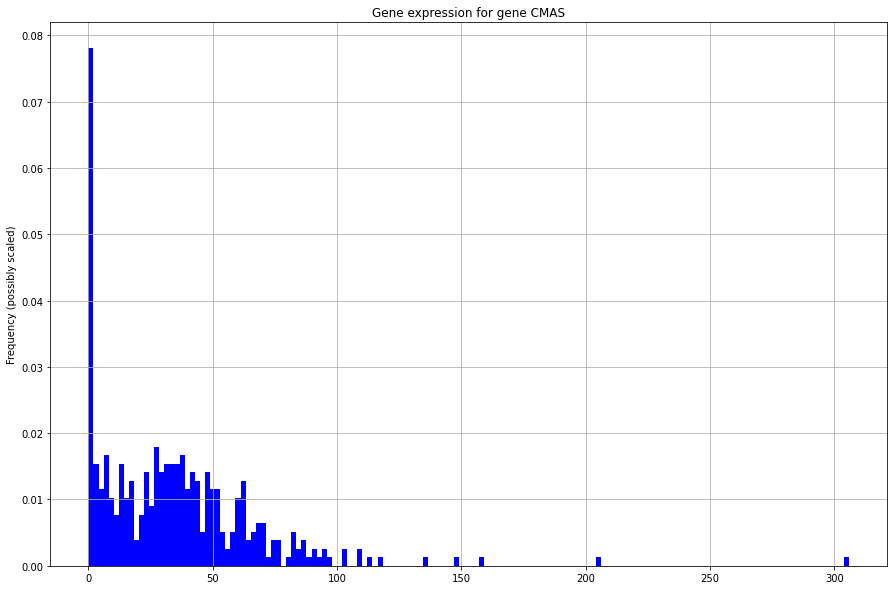

In [ ]:
rdn_gene = random.randrange(unfilt.shape[0])

plt.figure(figsize=(15, 10))
unfilt.iloc[rdn_gene, :].plot.hist(grid=True,
                                      density = True,
                                      bins=150,
                                      color='blue')

plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")
plt.ylabel("Frequency (possibly scaled)")

But we see that this is not the case!  All the other genes will display a similar distribution and we point out three important common characteristics:
- A low number of counts associated with a large proportion of genes
- A long right tail due to the lack of any upper limit for expression
- A large dynamic range

The distribution seems therefor to follow a Poisson/Negative binomial distribution. (where in the first case we assume the mean to be equal to the variance and in the second case we don't). The intuition of why is that the case is the following:

**With RNA-Seq data, a very large number of RNAs are represented and the probability of pulling out a particular transcript is very small**

Under this light, this really resables the canonical examples of "customers entering the shop in a fixed interval of time" or "Number of accidents in a day an insurance company will have to pay for" that are typically used to explain the Poisson Distribution.

---
Given what stated above, we further investigate the ralation between mean and variance of the gene expression among cells to see if we would prefer adopting a Negative Binomial ditribution:

Text(0, 0.5, 'Variance')

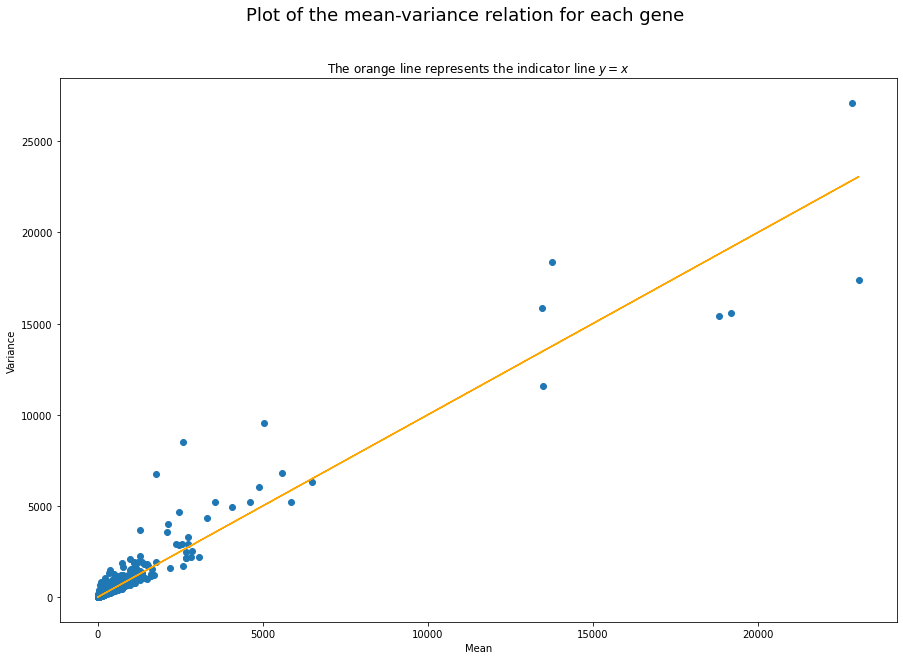

In [ ]:
##################### THIS PLOT COULD TAKE SOME TIME ########################
mean_vector = unfilt.T.describe().iloc[1,:]
var_vector = unfilt.T.describe().iloc[2,:]

plt.figure(figsize=(15, 10))
plt.scatter(mean_vector, var_vector)
plt.plot(mean_vector, mean_vector, color = "orange")
plt.title("The orange line represents the indicator line $y=x$", fontsize = 12)
plt.suptitle("Plot of the mean-variance relation for each gene", fontsize = 18)
plt.xlabel("Mean")
plt.ylabel("Variance")


Clearly we see that there's a sort of linear 1:1 relation between mean and variance, we can try to use the Poisson distribution to model the gene expression and use it to identify **HVG** (Highly Variable Genes). Those will be the genes we want to keep when filtering (See the next part)

### Filtering and Normalization

#### Cells filtering

We now check if the total reads among cells follow a normal distribution, meaning that the difference in total read counts it's just a measurement error. This is reasonable given that we expect the same cell-line grown in just two different states to show more or less the same total gene expression.

Moreover, we remind that in the experiment two other kind of normalizations are applyed to reduce possible problems in the total read count:
- We extract the same amount of Rna (In the LAB)
- We adjust the runs to get similar number of counts for each sample (in the sequencing facilities)

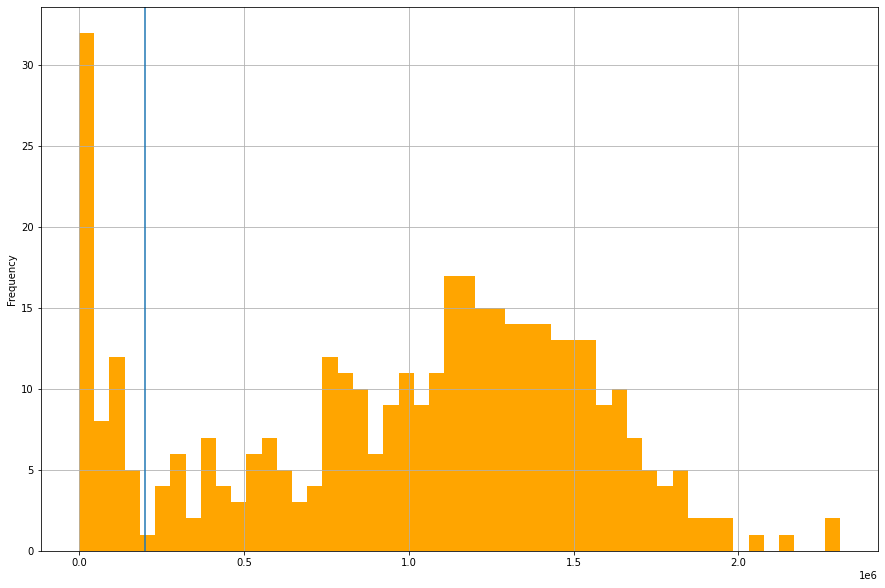

In [ ]:
totsums = unfilt.sum(axis = 0)

plt.figure(figsize=(15, 10))
plt.axvline(x=0.20e6) #Where do we want to do the cut in our filtering
totsums.plot.hist(grid = True, bins = 50, color= "orange")

Now we want to plot an istogram of the number of genes different from zero for each cell, also this should follow a normal distribution (this is a stadard step in each analysis)

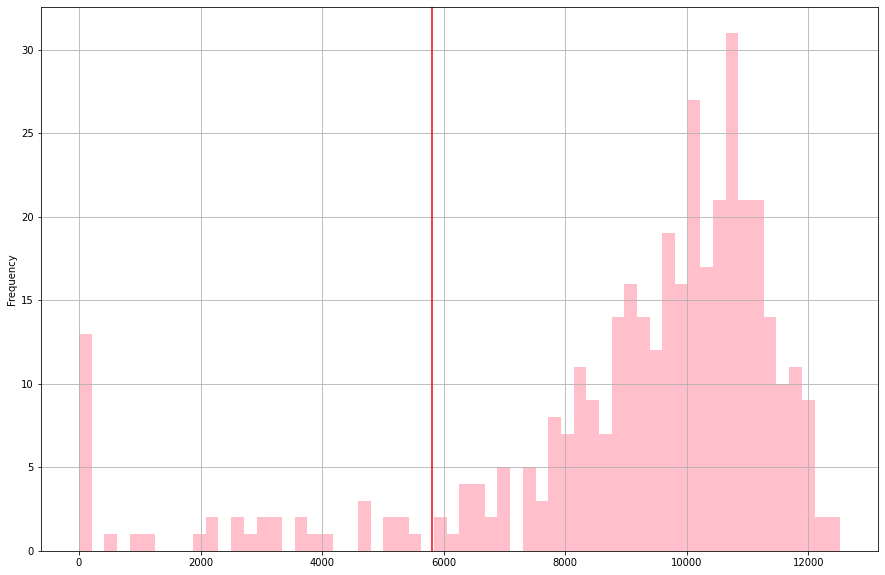

In [ ]:
#Create a copy dataframe where all the positive entries will become equal to one
copy = unfilt.copy()
copy[copy != 0] = 1
totcopysums = copy.sum(axis = 0)

plt.figure(figsize=(15, 10))
plt.axvline(x=5800, color = "red") #Where do we want to do the cut in our filtering
totcopysums.plot.hist(grid = True, bins = 60, color= "pink")

The plots are suggesting that indeed there's a measuement error following a normal distribution and therefore we would like to cut those cells that do not follow this curve, because their gene expression may be corrupted by human mistakes in extracting the data or by the health status of the cell itself

The blue vertical line in the first plot and the red one in the second indicate where (by eye) the plot finishes to be a nice bell-shaped histogram and thus where we want to cut in the filtering.


---

Here we proceed with the above described filtering

In [ ]:
filtered  = unfilt.loc[:, (totsums >= .20e6) & (copy.sum(axis = 0) >= 5800)]
perc_cell_lost = (unfilt.shape[1] - filtered.shape[1]) / unfilt.shape[1] * 100
print(f" We passed from haveing {unfilt.shape[1]} cells to have {filtered.shape[1]} cells\n This results in a lost of the {perc_cell_lost}% of the cells")

 We passed from haveing 383 cells to have 320 cells
 This results in a lost of the 16.449086161879894% of the cells


In [ ]:
filtered

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,1,10,1,0,5,4,1,...,2,1,1,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4,0,3,3,0,0,14,9,3,0,...,1,0,4,4,0,1,6,0,7,4
MT-CYB,270,76,727,2717,9326,3253,7949,2853,570,215,...,140,239,3795,2263,1368,570,3477,349,2184,1149
MT-TT,0,0,0,1,1,1,4,2,4,0,...,0,0,7,2,0,0,3,0,2,2
MT-TP,5,0,0,1,1,4,2,5,7,2,...,1,0,14,11,2,0,7,2,28,11


We now want to study the percentage of mitochondrial RNA and cut those cells at a rate that is too high (above 4%/5% is the rule of thumb that we adopt here, but in general this trashold is study-specific and there's active discussion inside the community about how to decide it). The idea behind this filtering is that when a cell is lysed during the process of Rna extraction or the cell membrane is disrupted, the cytoplasmatic transcript is released while mitochondrial RNA is more protected because of a double membrane around mitochondria. Therefore the high percentage of mtRNA would indicate poor quality of the cell condition

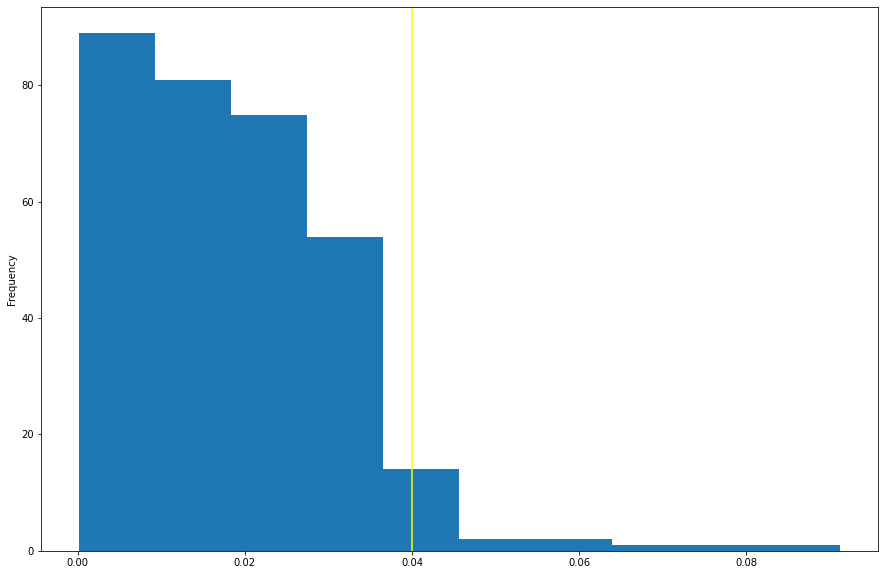

In [ ]:
total_mitocondrial = filtered[filtered.index.str.startswith('MT-')].sum(axis = 0)
total_express = filtered.sum(axis = 0)
assert len(total_mitocondrial) == len(total_express)

mito_ratio = total_mitocondrial / total_express

plt.figure(figsize=(15, 10))
plt.axvline(x=0.04, color = "yellow") #Where do we want to do the cut in our filtering
mito_ratio.plot.hist()

We filter cells with too much mitocondrial RNA

In [ ]:
filtered_cells = filtered.loc[:, mito_ratio <= 0.04]
filtered_cells

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,1,10,1,0,5,4,1,...,2,1,1,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4,0,3,3,0,0,14,9,3,0,...,1,0,4,4,0,1,6,0,7,4
MT-CYB,270,76,727,2717,9326,3253,7949,2853,570,215,...,140,239,3795,2263,1368,570,3477,349,2184,1149
MT-TT,0,0,0,1,1,1,4,2,4,0,...,0,0,7,2,0,0,3,0,2,2
MT-TP,5,0,0,1,1,4,2,5,7,2,...,1,0,14,11,2,0,7,2,28,11


And this is the end for us of the filtering of the cells.

---

#### Normalization

We first recall what is the distribution of a randomly choosen gene, this time within the cells that passed the filtering section

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Gene expression for gene MIR6790')

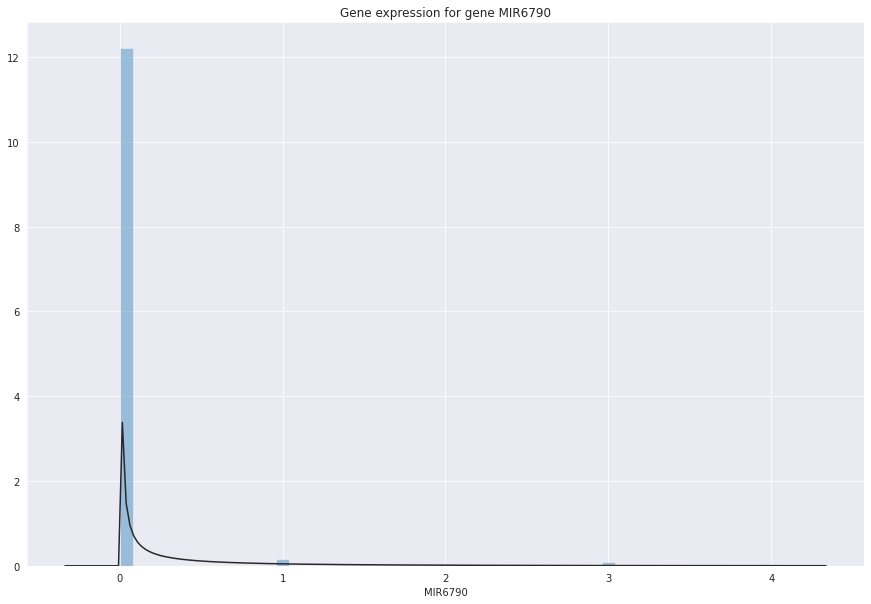

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])
plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(filtered_cells.iloc[rdn_gene, :], fit=stats.gamma,
                                          kde=False,
                                          bins = 50)
plt.title(f"Gene expression for gene {unfilt.index[rdn_gene]}")


Here you see an histogram with a gamma distribution fitted. Why a gamma distribution? This is because we want a smooth and contiuos verion of the Poisson distribution (that would be an Exponential), but with a bit more of freedom so we fitted a Gamma (Sum of Exponentials)

We now want to check that normalizing for total reads across cells will change the distribution for our single gene. This is a normalization in Cell dimension and reading depth, if we want to perform comparisons within cells we need them to be indeed comparable. This kind of normalization is commonly known as **Library Size Normalization**.

In [ ]:
unfilt_CPM = filtered_cells.copy()

#CPM normalization
for i in range(unfilt_CPM.shape[1]):
  unfilt_CPM.iloc[:,i] = unfilt_CPM.iloc[:,i]/(sum(unfilt_CPM.iloc[:,i])/10e6)


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


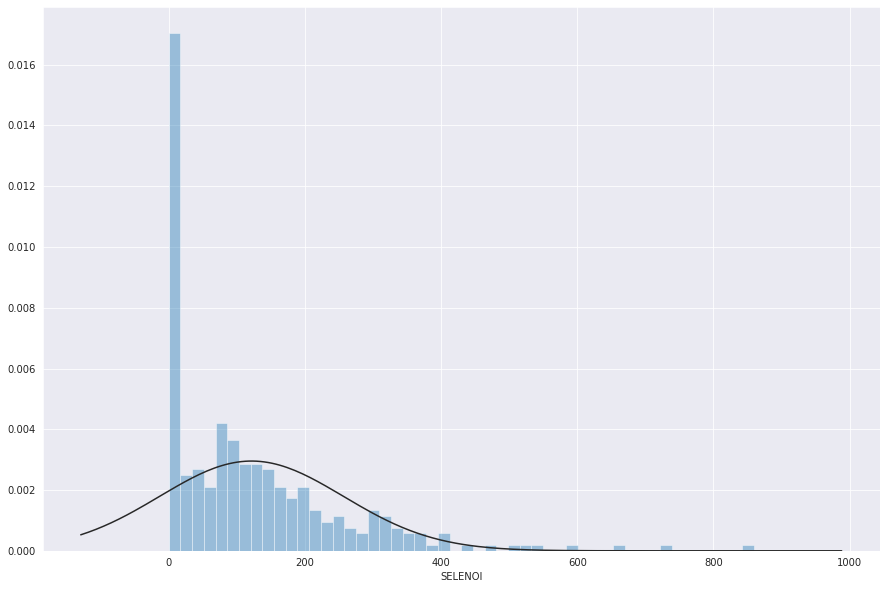

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])

plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(unfilt_CPM.iloc[rdn_gene, :], fit=stats.norm,
                                          kde=False,
                                          bins = 50)

We have the concern that this:
- artificially increases variance for genes espressed around zero
- Inflation on gene counts for cell types with low transcript numbers
- topological distorsion in the cell neightborhood structure, affecting clustering distance matrix

These are a major concern when you want to compare the gene expression. To better understand that consider the following example: you have two cells where a single gene $X$ is upregulated in cell $A$ compared to cell $B$. What happens is that when $X$ is assigned more reads or UMIs, the library size factor is increasing and is yielding smaller normalized expression values for all non-DE genes . In such a case, the net effect is that non-DE genes in $A$ will incorrectly appear to be downregulated compared to $B$. This baias get worse and worse the more gene $X$ is upregulated in cell $A$ compared to cell $B$

In CPM normalization is assumed that the only difference between samples is total counts and this is of course a very strict and quite naive assumption. What is usually done is to use some normalization teqniques that try to calculate a normalization factor that keeps into account not only the total count on the cell, but also the distribution of the genes. Investigating this issue is a bit behond the scope of this project so we will limit ourself to a CPM normalization.

Notice that given the fact that we are not using UMI counts for this specific datset, but just normal counts we would also need to normalize for the gene lenght. The idea here is that longer genes will recive more reads than sorter ones, but this for us will not be a problem as long as we just make relative comparisons for the same gene among the different samples (that is exactly what we will do soon trying to find out the Highly expressed genes)

In [ ]:
#Log + 1 transfomration
Normal = np.log(unfilt_CPM.copy() + 1)
Normal

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.365236,0.000000,0.000000,2.661687,0.000000,0.000000,0.000000,2.089981,0.000000,2.071603
MIR6859-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,2.458090,0.000000,0.000000,2.169823,4.074680,2.072767,0.000000,3.129438,3.248437,2.453432,...,3.010281,3.262451,2.430271,0.000000,0.000000,0.000000,2.287957,2.089981,3.278668,3.574806
OR4F29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.999464,0.000000
MTND1P23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,3.778033,0.000000,4.511071,3.189250,0.000000,0.000000,4.517160,3.697592,2.973617,0.000000,...,2.365236,0.000000,3.748276,3.994187,0.000000,3.258219,3.991365,0.000000,3.822004,3.358643
MT-CYB,7.967374,5.951609,9.990384,9.955893,10.895531,10.025656,10.847944,9.431479,8.168453,7.734585,...,7.208983,8.700034,10.579607,10.313778,10.208150,9.564710,10.334916,7.813423,9.542952,8.983719
MT-TT,0.000000,0.000000,0.000000,2.169823,1.914444,2.072767,3.291331,2.276698,3.248437,0.000000,...,0.000000,0.000000,4.297744,3.319294,0.000000,0.000000,3.316523,0.000000,2.622506,2.699687
MT-TP,3.996592,0.000000,0.000000,2.169823,1.914444,3.359929,2.634713,3.129438,3.791269,3.102629,...,2.365236,0.000000,4.984069,4.993995,3.705062,0.000000,4.142873,2.719288,5.191749,4.347861


We now look at the effect of this normalization on the distribution of a random gene.

N.B: you can run this cell multiple times to see different genes choosen. As you can see it's not difficult to find genes with almost all zero reads (we will take care of this issue soon)

/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


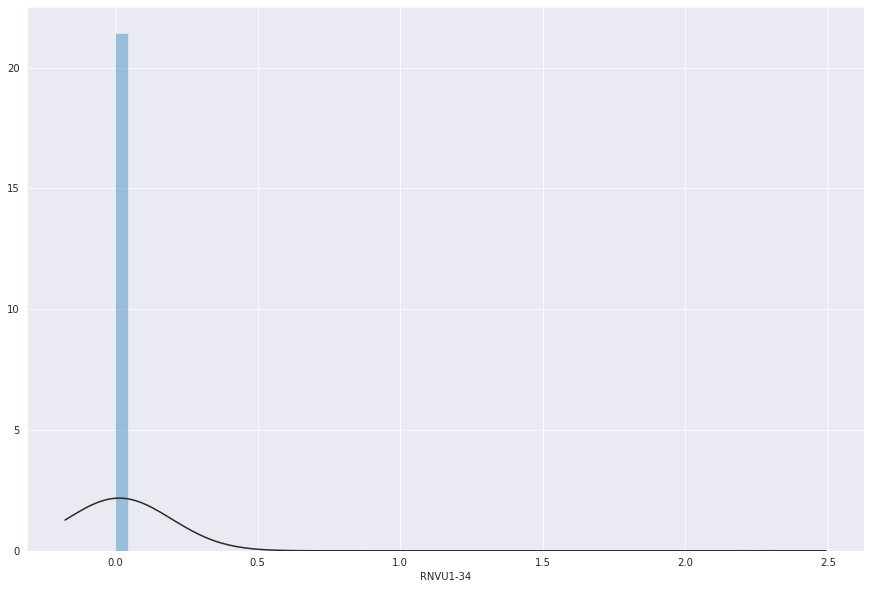

In [ ]:
rdn_gene = random.randrange(filtered_cells.shape[0])

plt.figure(figsize=(15, 10))
sns.set_style('darkgrid')
sns.distplot(Normal.iloc[rdn_gene, :], fit=stats.norm,
                                          kde=False,
                                          bins = 50)

In [ ]:
Normal

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,2.365236,0.000000,0.000000,2.661687,0.000000,0.000000,0.000000,2.089981,0.000000,2.071603
MIR6859-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,2.458090,0.000000,0.000000,2.169823,4.074680,2.072767,0.000000,3.129438,3.248437,2.453432,...,3.010281,3.262451,2.430271,0.000000,0.000000,0.000000,2.287957,2.089981,3.278668,3.574806
OR4F29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.999464,0.000000
MTND1P23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,3.778033,0.000000,4.511071,3.189250,0.000000,0.000000,4.517160,3.697592,2.973617,0.000000,...,2.365236,0.000000,3.748276,3.994187,0.000000,3.258219,3.991365,0.000000,3.822004,3.358643
MT-CYB,7.967374,5.951609,9.990384,9.955893,10.895531,10.025656,10.847944,9.431479,8.168453,7.734585,...,7.208983,8.700034,10.579607,10.313778,10.208150,9.564710,10.334916,7.813423,9.542952,8.983719
MT-TT,0.000000,0.000000,0.000000,2.169823,1.914444,2.072767,3.291331,2.276698,3.248437,0.000000,...,0.000000,0.000000,4.297744,3.319294,0.000000,0.000000,3.316523,0.000000,2.622506,2.699687
MT-TP,3.996592,0.000000,0.000000,2.169823,1.914444,3.359929,2.634713,3.129438,3.791269,3.102629,...,2.365236,0.000000,4.984069,4.993995,3.705062,0.000000,4.142873,2.719288,5.191749,4.347861


---

### Data filtering


#### Assuming normality of the transformed data

In this section we try to find the Higly Variable genes and keep them, discarding all the others. In this first version of the filtering we use the data $log( x + 1)$ transformed.

First of all we divide our normalized and filtered with respect to cells dataframe `Normal` into two smaller dataframes: one containing the cells that grew up under Hypoxia `meta["Condition"] == "Hypo"` and one containing the cells that grew up under Normoxia `meta["Condition"] == "Norm"`

In [ ]:
t_norm = Normal.T.copy()

#We divide the dataset in two subdatasets containing the hypoxic and the normal cells
hypo = t_norm[meta["Condition"] == "Hypo"].T
norm = t_norm[meta["Condition"] == "Norm"].T

hypo.columns = hypo.columns.str.replace("output.STAR.", "")
hypo.columns = hypo.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")

norm.columns = norm.columns.str.replace("output.STAR.", "")
norm.columns = norm.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The default value of regex will change from True 

Now we have a look to the result for the new dataframe `hypo` and we check if the dimensions of the two dataframes are similar

In [ ]:
print(f"The dataframe hypo has dimension: {hypo.shape} \nThe dataframe norm has dimension: {norm.shape}")
hypo

The dataframe hypo has dimension: (22905, 158) 
The dataframe norm has dimension: (22905, 146)


,1_A10_Hypo_S28,1_A12_Hypo_S30,1_B10_Hypo_S76,1_B11_Hypo_S77,1_B12_Hypo_S78,1_B7_Hypo_S73,1_B8_Hypo_S74,1_C10_Hypo_S124,1_C11_Hypo_S125,1_C12_Hypo_S126,...,4_G11_Hypo_S335,4_G12_Hypo_S336,4_G7_Hypo_S331,4_G8_Hypo_S332,4_G9_Hypo_S333,4_H10_Hypo_S382,4_H14_Hypo_S383,4_H7_Hypo_S379,4_H8_Hypo_S380,4_H9_Hypo_S381
WASH7P,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,2.365236,0.000000,2.089981,0.000000,2.071603
MIR6859-1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
WASH9P,2.458090,0.000000,3.129438,3.248437,2.453432,3.960486,3.335930,3.286287,0.000000,2.641720,...,2.974692,3.324409,0.000000,0.000000,2.479201,3.010281,3.262451,2.089981,3.278668,3.574806
OR4F29,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.999464,0.000000
MTND1P23,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,3.778033,0.000000,3.697592,2.973617,0.000000,0.000000,0.000000,0.000000,0.000000,4.088796,...,2.974692,0.000000,4.201741,3.448069,2.479201,2.365236,0.000000,0.000000,3.822004,3.358643
MT-CYB,7.967374,5.951609,9.431479,8.168453,7.734585,7.343093,5.202339,7.511404,7.739817,9.019987,...,8.655795,7.674401,8.732240,8.359999,8.555176,7.208983,8.700034,7.813423,9.542952,8.983719
MT-TT,0.000000,0.000000,2.276698,3.248437,0.000000,0.000000,0.000000,3.679209,0.000000,2.017389,...,0.000000,0.000000,2.650457,0.000000,4.019237,0.000000,0.000000,0.000000,2.622506,2.699687
MT-TP,3.996592,0.000000,3.129438,3.791269,3.102629,0.000000,0.000000,2.629850,3.367738,3.023153,...,2.974692,2.295311,3.307656,3.946090,3.520318,2.365236,0.000000,2.719288,5.191749,4.347861


##GROUP 2 GENE SELECTION

We want to identify those genes for which we can see a statistically significant difference in the ditribution of the genes expression among all the cells. Those will be the genes that we want to keep for our furure studies.

We start by applying a t-test to obtain some raw p-values that identify statistically significant genes. Here is where we naively assume normality of the data, leveraging on the central limit theorem given that the two sample sizes are respectively 158 and 146)

In [ ]:
#We create a dict to store the inial un adjusted p-values
p_val_row = {}
for i in range(Normal.shape[0]):
  p_val_row[i] = stats.ttest_ind(hypo.iloc[i,:], norm.iloc[i,:], equal_var=False).pvalue

We plot the result on an histogram that is as would expect: A lot of genes seems statistically significant and then you have an "under layer" of uniform distribution coming from the non significant expressed genes.

Text(0.5, 1.0, 'p-value histogram')

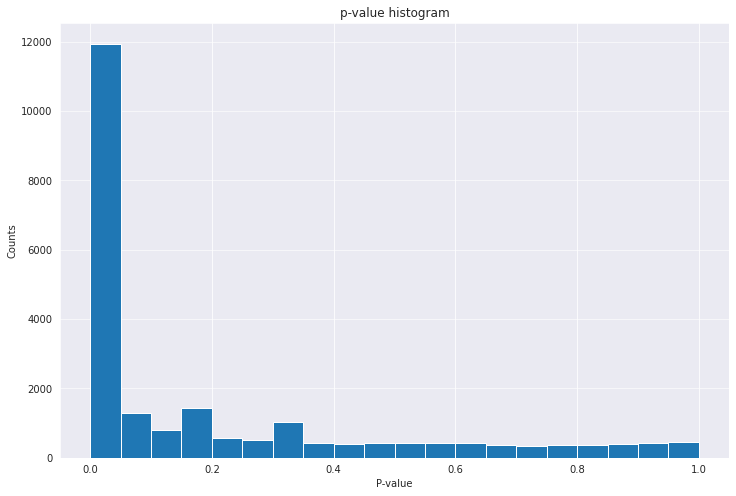

In [ ]:
plt.figure(figsize=(12,8))
plt.hist(p_val_row.values(),
         bins = 20)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('P-value')
plt.ylabel('Counts')
plt.title('p-value histogram')

Of course, when having to deal with so many tests we will incur in the so called "Multiple Testing Problem" and one way to deal with it is to change the p-values into q-values using the Benjamini-Hochberg correction. These values are also known as FDRs (False Discovery Rates) and we write down a function called `q-value` that computes them.

Sometimes, however, the Benjamini-Hochberg correction is very good ad eliminating False positives, but sometimes it shriks too much the number of true positive, when adjusting the p-values. This eccesive shrinking behaviour can lead to a significant loss of important genes and we have to account for that.

This is exactly what we do in the next part:
- We try different CPM trashold (see the description of the function)
- We calculate the ajusted p-values on the genes that come out of this procedure



In [ ]:
def filter_CPM(treshold):
  '''
  This function takes as input a CPM trashold and then it looks for each gene if there are
  at least two cells with the CPM that is over the given trashold. It then stores the indices
  of the genes that did NOT pass this barrier test.
  '''
  to_filter_list = []
  for i in range(Normal.shape[0]):
    mask = [element for element in Normal.iloc[i,:] if element >= treshold]
    if len(mask) <= 2:
      to_filter_list.append(i)
  return to_filter_list

And here we apply this test with a trashold of `CPM = 1`

In [ ]:
len(filter_CPM(5))

8759

In [ ]:
def q_value (p_val_dict):
  sorted_list = [[key, value] for (key, value) in sorted(p_val_dict.items(), key=lambda x: x[1])]
  rank = 1
  for p in sorted_list:
    p[1] = p[1] * len(p_val_dict)/rank
    rank += 1
  q_val_dict = dict(sorted_list)
  q_val_dict = (sorted(q_val_dict.items()))
  return q_val_dict

In [ ]:
def graph_data_due(p_val_pre):
  y_axis = []
  for treshold in np.arange(0, 20, 1):
    aux_dictt = p_val_pre.copy()
    indices = filter_CPM(treshold)
    print("how many genes will be ignored in this iteration", len(indices))
    for ind in indices:
      del aux_dictt[ind]
    count = len([value for value in q_value(aux_dictt) if value[1] <= 0.05])
    print("Relevant number of genes for this treshold", count)
    y_axis.append(count)
    aux_dictt = p_val_pre.copy()
  return y_axis


In [ ]:
#Calculating this values will take some time, it has to go 20 iterations
y = graph_data_due(p_val_row)

how many genes will be ignored in this iteration 0
Relevant number of genes for this treshold 10726
how many genes will be ignored in this iteration 1997
Relevant number of genes for this treshold 11124
how many genes will be ignored in this iteration 2261
Relevant number of genes for this treshold 11135
how many genes will be ignored in this iteration 4567
Relevant number of genes for this treshold 11075
how many genes will be ignored in this iteration 6584
Relevant number of genes for this treshold 10678
how many genes will be ignored in this iteration 8759
Relevant number of genes for this treshold 9859
how many genes will be ignored in this iteration 11813
Relevant number of genes for this treshold 8223
how many genes will be ignored in this iteration 16026
Relevant number of genes for this treshold 5383
how many genes will be ignored in this iteration 20235
Relevant number of genes for this treshold 2236
how many genes will be ignored in this iteration 22222
Relevant number of gen

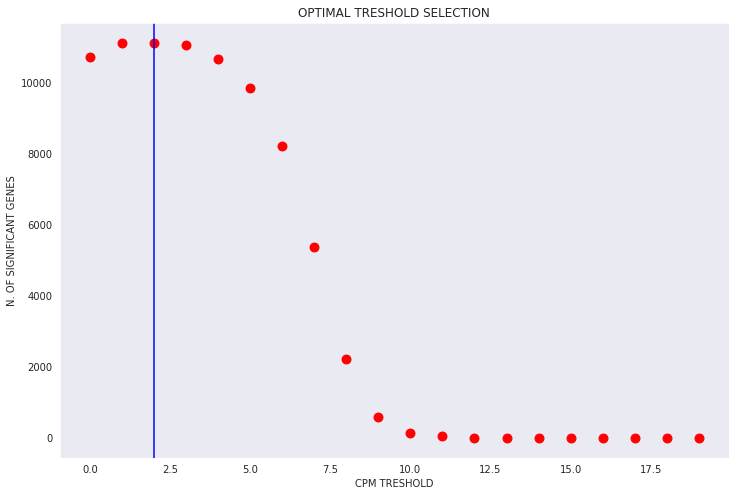

In [ ]:
x = np.arange(0, 20, 1)
plt.figure(figsize=(12,8))
plt.scatter(x, y,
            s = 80,
            color = "r")
plt.grid()
plt.xlabel('CPM TRESHOLD')
plt.ylabel('N. OF SIGNIFICANT GENES')
plt.title('OPTIMAL TRESHOLD SELECTION')
plt.axvline(x=2, color = "blue")
plt.show()

Given that we want to preserve as many significant genes as possible when adjusting the p-values, we choose a CMP cut of 3

In [ ]:
#We calculate the optimal set of genes
indices = filter_CPM(3)
final_dictt = p_val_row.copy()

for ind in indices:
  del final_dictt[ind]

#Notice that the sensitivity setted is very very small: 0.001%
final_indices = [value[0] for value in q_value(final_dictt) if (value[1] <= 0.00001)]

We apply this to the dataset we had to finally obtain the final filtered version

In [ ]:
filt_lollo_1 = Normal.copy().iloc[final_indices]
filt_lollo_1

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
MTND2P28,3.107496,1.799125,0.000000,2.169823,2.909602,3.753747,4.649326,4.198455,2.973617,0.000000,...,0.000000,0.000000,3.748276,3.319294,3.036216,0.000000,2.929035,3.923820,5.226648,3.574806
MTCO1P12,3.107496,1.799125,0.000000,3.189250,4.074680,3.576100,3.507006,1.681242,3.463783,3.102629,...,0.000000,3.262451,4.297744,3.994187,0.000000,3.258219,3.812731,0.000000,3.278668,3.082488
MTCO2P12,0.000000,1.799125,0.000000,0.000000,1.914444,2.700929,2.010849,0.000000,0.000000,0.000000,...,0.000000,0.000000,2.430271,2.661687,0.000000,0.000000,3.812731,0.000000,0.000000,0.000000
MTATP6P1,5.739124,4.119562,7.621409,7.362403,8.293341,7.266854,8.508507,7.278081,5.654682,5.662825,...,5.489614,7.136223,8.022050,7.955625,7.862591,7.111640,8.094766,5.458722,7.283999,6.201655
MTCO3P12,0.000000,0.000000,0.000000,0.000000,2.531021,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,3.036216,0.000000,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-ND5,8.593349,1.799125,8.869612,8.844412,8.908920,8.470823,9.740780,8.700192,8.654661,8.602018,...,8.180384,9.052466,9.588136,9.821363,9.100802,9.051003,9.566259,6.087355,9.421393,9.128485
MT-TE,3.778033,0.000000,4.511071,3.189250,0.000000,0.000000,4.517160,3.697592,2.973617,0.000000,...,2.365236,0.000000,3.748276,3.994187,0.000000,3.258219,3.991365,0.000000,3.822004,3.358643
MT-CYB,7.967374,5.951609,9.990384,9.955893,10.895531,10.025656,10.847944,9.431479,8.168453,7.734585,...,7.208983,8.700034,10.579607,10.313778,10.208150,9.564710,10.334916,7.813423,9.542952,8.983719
MT-TT,0.000000,0.000000,0.000000,2.169823,1.914444,2.072767,3.291331,2.276698,3.248437,0.000000,...,0.000000,0.000000,4.297744,3.319294,0.000000,0.000000,3.316523,0.000000,2.622506,2.699687


Last, we try to implement a function that returns the name of the n most significant genes, based on the adjusted p_values calculated before

In [ ]:
def top_genes (n):
  sorted_list = [[key, value] for (key, value) in sorted(p_val_row.items(), key=lambda x: x[1])]
  rank = 1
  for p in sorted_list:
    p[1] = p[1] * len(p_val_row)/rank
    rank += 1

  indices = []
  for couple in sorted_list[:n]:
    indices.append(couple[0])

  for index in indices:
    print(Normal.index.values[index])


In [ ]:
top_genes(20)

ENO1
C4orf3
NDRG1
GAPDHP1
ELOVL2
PARK7
HK2P1
HNRNPA2B1
AURKAIP1
ELOVL6
PGK1
HMGN2
NECAB1
MTATP6P1
SLC2A1
RIMKLA
PFKFB4
GAPDHP65
TAF9B
FKBP5


Luckly enough at position #3 (NDRG1) and #11 (PGK1) we find two genes that we know are directly involved in the cell reaction to hypoxia (According to [DAVID Database](https://david.ncifcrf.gov/)). This little naive and baiased filtering gave us some nice results at the end and that's why we wanted to include it in the discussion

- **NDRG1**: This gene is a member of the N-myc downregulated gene family which belongs to the alpha/beta hydrolase superfamily. The protein encoded by this gene is a cytoplasmic protein involved in stress responses, hormone responses, cell growth, and differentiation. The encoded protein is necessary for p53-mediated caspase activation and apoptosis. Mutations in this gene are a cause of Charcot-Marie-Tooth disease type 4D, and expression of this gene may be a prognostic indicator for several types of cancer.

- **PGK1**:	The protein encoded by this gene is a glycolytic enzyme that catalyzes the conversion of 1,3-diphosphoglycerate to 3-phosphoglycerate. The encoded protein may also act as a cofactor for polymerase alpha. Additionally, this protein is secreted by tumor cells where it participates in angiogenesis by functioning to reduce disulfide bonds in the serine protease, plasmin, which consequently leads to the release of the tumor blood vessel inhibitor angiostatin.

In [ ]:
proffilt = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)

In [ ]:
counter = 0
for gene in proffilt.index.values:
  if gene in filt_lollo_1.index.values:
    counter +=1

print(f"Sovrapposition between our dataframe and the provided dataframe: {counter/3000 *100}%")

Sovrapposition between our dataframe and the provided dataframe: 33.46666666666667%


---

---
#### Nonparametric estimate

The idea here is to use not normalized data for filtering out genes, given that normalization as described above does not correct for library composition bias. Here the idea is to take the data as they are and perform the filtering in a similar way than before

To avoid numerical problem when applying the test and to stabilize the result we decide to cut all those genes with a CPM  

This also makes sense heuristically, because we dont want to calssify as significantly DE gene one that passes from mean count $0.2$ to mean count $0.8$ (The mean expression is four times higher, but given the low range of values this could be misleading)  

In [ ]:
def filter_CPM_keep_np(treshold):
  '''
  This function takes as input a CPM trashold and then it looks for each gene if there are
  at least two cells with the CPM that is over the given trashold. It then stores the indices
  of the genes that did NOT pass this barrier test.
  '''
  to_keep_list = []
  for i in range(filtered_cells.shape[0]):
    mask = [element for element in filtered_cells.iloc[i,:] if element >= treshold]
    if len(mask) >= 2:
      to_keep_list.append(i)
  return to_keep_list

np_to_keep_ind = filter_CPM_keep_np(1)
np_filt_1 = filtered_cells.copy().iloc[np_to_keep_ind]

In [ ]:
np_filt_1

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
WASH7P,0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,1,0,1
MIR6859-1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
WASH9P,1,0,0,1,10,1,0,5,4,1,...,2,1,1,0,0,0,1,1,4,5
OR4F29,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
MTND1P23,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
MT-TE,4,0,3,3,0,0,14,9,3,0,...,1,0,4,4,0,1,6,0,7,4
MT-CYB,270,76,727,2717,9326,3253,7949,2853,570,215,...,140,239,3795,2263,1368,570,3477,349,2184,1149
MT-TT,0,0,0,1,1,1,4,2,4,0,...,0,0,7,2,0,0,3,0,2,2
MT-TP,5,0,0,1,1,4,2,5,7,2,...,1,0,14,11,2,0,7,2,28,11


In [ ]:
t_np_filt_1 = np_filt_1.T.copy()

#We divide the dataset in two subdatasets containing the hypoxic and the normal cells
hypo_np = t_np_filt_1[meta["Condition"] == "Hypo"].T
norm_np = t_np_filt_1[meta["Condition"] == "Norm"].T

hypo_np.columns = hypo_np.columns.str.replace("output.STAR.", "")
hypo_np.columns = hypo_np.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")

norm_np.columns = norm_np.columns.str.replace("output.STAR.", "")
norm_np.columns = norm_np.columns.str.replace("_Aligned.sortedByCoord.out.bam", "")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  """
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: FutureWarning: The default value of regex will change from True to False in a future version.
  import sys
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:8: FutureWarning: The default value of regex will change from True to False in a future version.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: The default value of regex will change from True to False in a future version.
  # Remove the CWD from sys.path while we load stuff.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: The default value of regex will change from True 

As described above the non normalize data for the genes have an histogram that follows a poisson distribution, here below we show again this selecting at random four genes and plotting their boxplots. It's pretty clear that we cannot adopt the assumption of normality

{'boxes': [<matplotlib.lines.Line2D at 0x7f664a9051d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7f664a90f250>,
 'fliers': [<matplotlib.lines.Line2D at 0x7f664a92f290>,
 'means': [],
 'medians': [<matplotlib.lines.Line2D at 0x7f664a90fd10>,
 'whiskers': [<matplotlib.lines.Line2D at 0x7f664a905790>,
  <matplotlib.lines.Line2D at 0x7f664a933d90>]}

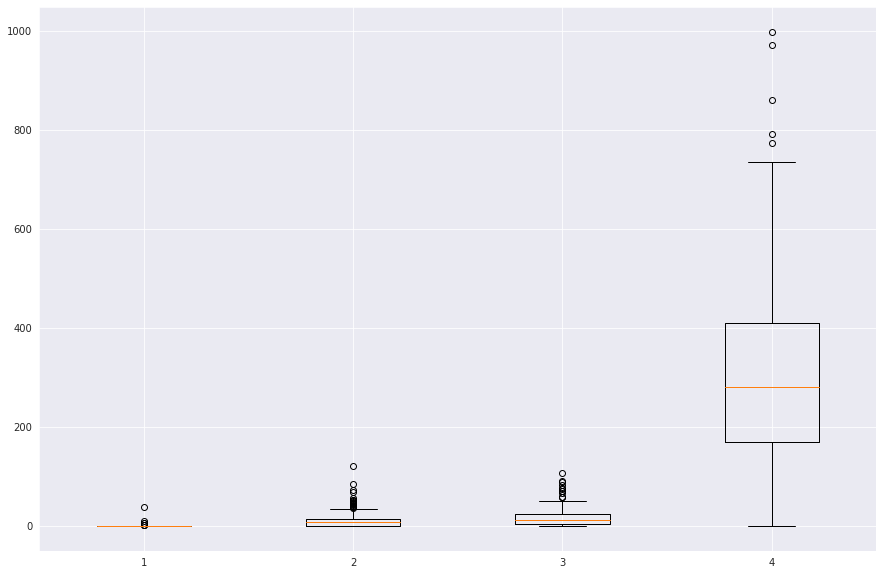

In [ ]:
rdn_gene_1 = random.randrange(filtered_cells.shape[0])
rdn_gene_2 = random.randrange(filtered_cells.shape[0])
rdn_gene_3 = random.randrange(filtered_cells.shape[0])
rdn_gene_4 = random.randrange(filtered_cells.shape[0])

plt.figure(figsize=(15, 10))
plt.boxplot(x = [filtered_cells.iloc[rdn_gene_1, :],
                 filtered_cells.iloc[rdn_gene_2, :],
                 filtered_cells.iloc[rdn_gene_3, :],
                 filtered_cells.iloc[rdn_gene_4, :]
                ])

This is why we proceed in a way that is analogus to the one proposed above but we use a non-parametric test to obrain the p-values, that is the **Wilcoxon-Mann-Whitney test** (alson known as the **Mann-Whitney U test**)

In [ ]:
p_val_row_np = {}
for i in range(np_filt_1.shape[0]):
  p_val_row_np[i] = stats.mannwhitneyu(x=hypo_np.iloc[i,:], y=norm_np.iloc[i,:], alternative = 'two-sided').pvalue


We now proceed following the same structure as what we did before, just adapting the function used above.

Text(0.5, 1.0, 'p-value histogram')

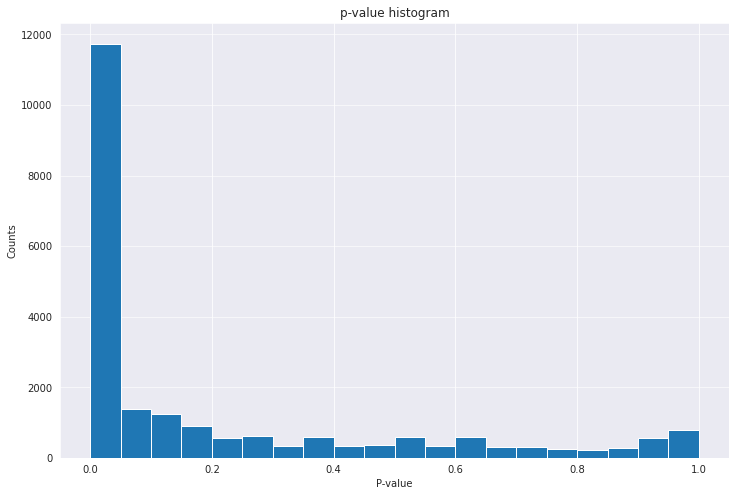

In [ ]:
plt.figure(figsize=(12,8))
plt.hist(p_val_row_np.values(),
         bins = 20)
plt.grid(axis='y', alpha=0.75)
plt.xlabel('P-value')
plt.ylabel('Counts')
plt.title('p-value histogram')

In [ ]:
def filter_CPM_np(treshold):
  '''
  This function takes as input a CPM trashold and then it looks for each gene if there are
  at least two cells with the CPM that is over the given trashold. It then stores the indices
  of the genes that did NOT pass this barrier test.
  '''
  to_filter_list = []
  for i in range(np_filt_1.shape[0]):
    mask = [element for element in np_filt_1.iloc[i,:] if element >= treshold]
    if len(mask) <= 2:
      to_filter_list.append(i)
  return to_filter_list

In [ ]:
def graph_data_due_np(p_val_pre):
  y_axis = []
  for treshold in np.arange(0, 20, 1):
    aux_dictt = p_val_pre.copy()
    indices = filter_CPM_np(treshold)
    print("how many genes will be ignored in this iteration", len(indices))
    for ind in indices:
      del aux_dictt[ind]
    count = len([value for value in q_value(aux_dictt) if value[1] <= 0.05])
    print("Relevant number of genes for this treshold", count)
    y_axis.append(count)
    aux_dictt = p_val_pre.copy()
  return y_axis

In [ ]:
y = graph_data_due_np(p_val_row_np)

how many genes will be ignored in this iteration 0
Relevant number of genes for this treshold 10757
how many genes will be ignored in this iteration 1375
Relevant number of genes for this treshold 10856
how many genes will be ignored in this iteration 3457
Relevant number of genes for this treshold 10843
how many genes will be ignored in this iteration 4346
Relevant number of genes for this treshold 10733
how many genes will be ignored in this iteration 4942
Relevant number of genes for this treshold 10633
how many genes will be ignored in this iteration 5383
Relevant number of genes for this treshold 10550
how many genes will be ignored in this iteration 5800
Relevant number of genes for this treshold 10438
how many genes will be ignored in this iteration 6098
Relevant number of genes for this treshold 10351
how many genes will be ignored in this iteration 6365
Relevant number of genes for this treshold 10260
how many genes will be ignored in this iteration 6608
Relevant number of gen

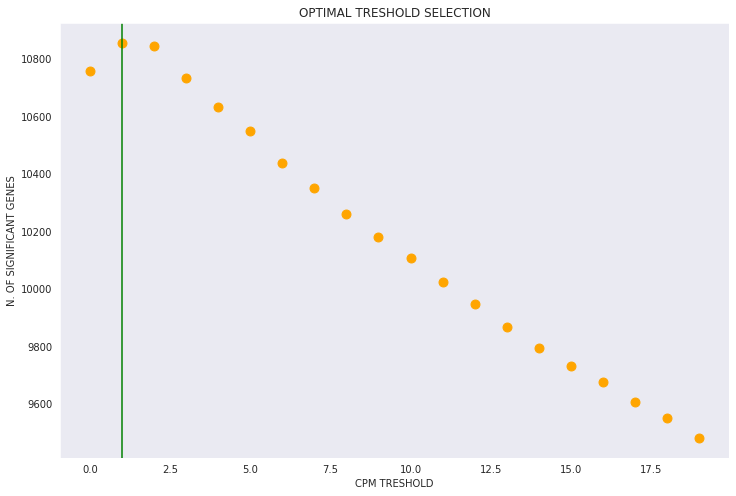

In [ ]:
x = np.arange(0, 20, 1)
plt.figure(figsize=(12,8))
plt.scatter(x, y,
            s = 80,
            color = "orange")
plt.grid()
plt.xlabel('CPM TRESHOLD')
plt.ylabel('N. OF SIGNIFICANT GENES')
plt.title('OPTIMAL TRESHOLD SELECTION')
plt.axvline(x=1, color = "green")
plt.show()

In [ ]:
#We calculate the optimal set of genes
indices_np = filter_CPM_np(2)
final_dictt_np = p_val_row_np.copy()

for ind in indices_np:
  del final_dictt_np[ind]

#Notice that the sensitivity setted is very very small: 0.001%
final_indices_np = [value[0] for value in q_value(final_dictt_np) if (value[1] <= 0.00001)]

In [ ]:
filt_lollo_2 = filtered_cells.copy().iloc[final_indices_np]
filt_lollo_2

,output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,output.STAR.1_A3_Norm_S3_Aligned.sortedByCoord.out.bam,output.STAR.1_A4_Norm_S4_Aligned.sortedByCoord.out.bam,output.STAR.1_A5_Norm_S5_Aligned.sortedByCoord.out.bam,output.STAR.1_A6_Norm_S6_Aligned.sortedByCoord.out.bam,output.STAR.1_B10_Hypo_S76_Aligned.sortedByCoord.out.bam,output.STAR.1_B11_Hypo_S77_Aligned.sortedByCoord.out.bam,output.STAR.1_B12_Hypo_S78_Aligned.sortedByCoord.out.bam,...,output.STAR.4_H10_Hypo_S382_Aligned.sortedByCoord.out.bam,output.STAR.4_H14_Hypo_S383_Aligned.sortedByCoord.out.bam,output.STAR.4_H1_Norm_S355_Aligned.sortedByCoord.out.bam,output.STAR.4_H3_Norm_S357_Aligned.sortedByCoord.out.bam,output.STAR.4_H4_Norm_S358_Aligned.sortedByCoord.out.bam,output.STAR.4_H5_Norm_S359_Aligned.sortedByCoord.out.bam,output.STAR.4_H6_Norm_S360_Aligned.sortedByCoord.out.bam,output.STAR.4_H7_Hypo_S379_Aligned.sortedByCoord.out.bam,output.STAR.4_H8_Hypo_S380_Aligned.sortedByCoord.out.bam,output.STAR.4_H9_Hypo_S381_Aligned.sortedByCoord.out.bam
MTND2P28,2,1,0,1,3,6,16,15,3,0,...,0,0,4,2,1,0,2,7,29,5
MTCO1P12,2,1,0,3,10,5,5,1,5,2,...,0,1,7,4,0,1,5,0,4,3
MTCO2P12,0,1,0,0,1,2,1,0,0,0,...,0,0,1,1,0,0,5,0,0,0
MTATP6P1,29,12,68,203,691,206,766,331,46,27,...,25,50,294,214,131,49,370,33,228,71
MTCO3P12,0,0,0,0,2,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZMAT5,30,0,15,75,24,19,59,0,19,20,...,0,13,32,42,31,20,0,44,22,92
UQCR10,68,256,167,386,549,323,251,376,238,114,...,259,60,208,420,181,166,354,115,113,201
HORMAD2-AS1,0,12,0,2,0,3,0,7,4,0,...,0,0,3,1,0,0,0,3,7,5
CNN2P1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
counter = 0
for gene in proffilt.index.values:
  if gene in filt_lollo_2.index.values:
    counter +=1

print(f"Sovrapposition between our dataframe and provided dataframe: {counter/3000 *100}%")

Sovrapposition between our dataframe and provided dataframe: 23.799999999999997%


We see hat now the allignment with the provided dataframe is worse than before (this is expected as the data now are not normalized as before)

---


Loading the data of meta and MCF7 filtered and normalised

In [ ]:
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
meta.head()

data frame dimensions : (3000, 250)


,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In [ ]:
# t_meta = meta.T
# print(t_meta.shape)
# hypo_ind = (meta["Condition"] == "Hypo")
# hypo_ind = hypo_ind.to_numpy()
# norm_ind = (~(hypo_ind))
# norm_ind.sum()
# hypo_ind

### Dimensionality Reduction

> Throughout this section, we will be applying a Principal Components Analysis for the purpose of analyzing data and dimensionality reduction, as well as other dimensionality reduction techniques and discuss their outcomes.

We start by converting our Pandas DataFrame into a NumPy array.

In [ ]:
data = df.to_numpy()

Then, we extract the indices of hypoxic and normoxic cells and build two lists out of them

In [ ]:
l_hypoxia = get_condition_list(df, "Hypo")
l_normoxia = get_condition_list(df, "Norm")
print(len(l_normoxia))
l_hypoxia[:10], l_normoxia[:10]

126


([4, 5, 6, 7, 14, 15, 16, 17, 18, 23], [0, 1, 2, 3, 8, 9, 10, 11, 12, 13])

#### PCA

As we import the PCA function from the SKLearn library, we proceed to apply it to our dataset, requesting a 95% variance expression on the reduced outcome.

In [ ]:
from sklearn.decomposition import PCA

In [ ]:
pca = PCA(n_components = 0.95)
data_red = pca.fit_transform(data.T)
pca.n_components_

20

We can notice that we need 20 principal components, in order to express 95% of the variance.

In [ ]:
data_red.shape

(250, 20)

In [ ]:
pca.explained_variance_ratio_[:3]

array([0.6344835 , 0.09107496, 0.06270155])

We now plot the results, starting from a 2D scatter plot on the two main principal components.

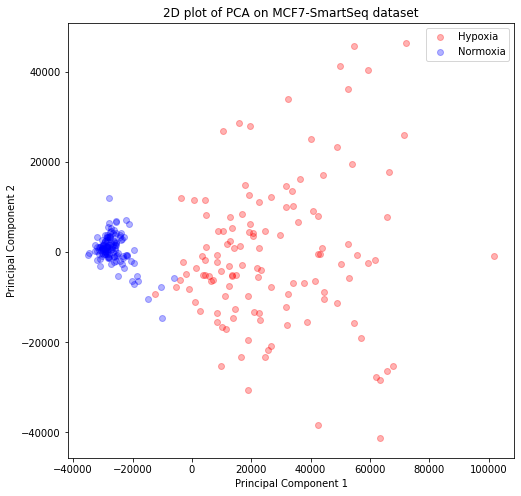

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_title('2D plot of PCA on MCF7-SmartSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()
plt.show()

Next, we can again build a scatter plot, 3D this time, as we take into account the third principal component as well.

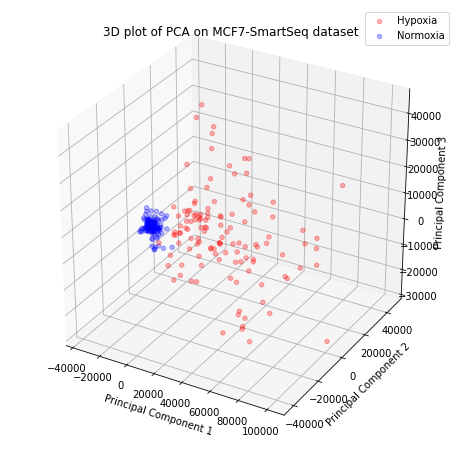

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('3D plot of PCA on MCF7-SmartSeq dataset')

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], data_red[l_hypoxia,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], data_red[l_normoxia,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

#### Interactive 3D version
> Might take a few minutes to run

Notice. The following implementation is quite time-consuming when executed on large-sized datasets (since a simpler static version of the 3D plot has been implemented above, we provide the code cell below commented).

In [ ]:
plot_df = pd.DataFrame(data_red[:, 0:3])
plot_df.columns = ["PC1","PC2","PC3"]

aux_lst = []
for name in df.columns.values:
  if 'Hypo' in name:
    aux_lst.append(1)
  elif 'Norm' in name:
    aux_lst.append(0)

plot_df["Color"] = aux_lst
plot_df

,x,y,z,Color
0,-26874.672396,766.013957,-880.248212,0
1,-26354.743000,5039.849020,-5372.826809,0
2,-29351.253485,2414.726753,-3076.254097,0
3,-24813.833293,-75.979072,-3934.877133,0
4,4454.732179,-1836.273354,-1595.912696,1
...,...,...,...,...
245,-18394.340467,-5274.416642,649.525614,0
246,-10023.164045,-14507.616731,-1941.969647,0
247,603.697715,11492.308191,43230.690452,1
248,17016.931253,8398.335833,4439.884803,1


In [ ]:
# !pip install jupyter-dash

import plotly.graph_objects as go
import plotly.express as px
from jupyter_dash import JupyterDash
import dash_core_components as dcc
import dash_html_components as html
from dash.dependencies import Input, Output

fig = px.scatter_3d(
    data_frame = plot_df,
    x = "PC1",
    y = "PC2",
    z = "PC3",
    color = "Color",
    title = "Interactive PCA plot with supervised labels",
)

# build jupyter dash app
app = JupyterDash(__name__)
# add html components and figure to app
app.layout = html.Div([dcc.Graph(figure=fig)])
# run app inline
app.run_server(mode='inline')

<IPython.core.display.Javascript object>

#### t-SNE


We first import TSNE from the SKLearn library

In [ ]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

Now, PCA is carried out on the dataframe, and all the data is mapped into a 50-dimensional space.
PCA is performed as a sort of pre-processing stage because t-SNE does not work properly on datasets having too many features (in this case the initial dataset has 3000 features), so we need to reduce the dimensionality to about 50 (a number of features with which t-SNE produces good results).

In [ ]:
pca50 = PCA(n_components=50)
data_fifty = pca50.fit_transform(data.T)
data_fifty.shape

(250, 50)

In [ ]:
pca50.explained_variance_ratio_[0:4]

array([0.6344835 , 0.09107496, 0.06270155, 0.04033215])

We now apply t-SNE on the output of PCA (i.e. the data_fifty reduced dataset).

In [ ]:
embedded = TSNE(n_components=2, learning_rate='auto', init='random').fit_transform(data_fifty)

In [ ]:
embedded.shape

(250, 2)

We now plot the results.

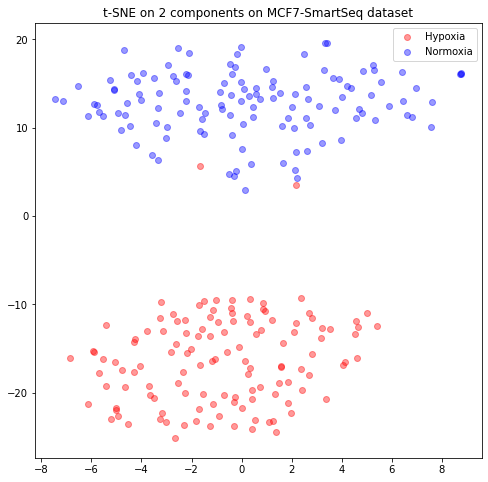

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedded[l_hypoxia,0], embedded[l_hypoxia,1], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedded[l_normoxia,0], embedded[l_normoxia,1], c="b",alpha = 0.4, label="Normoxia")
ax.set_title('t-SNE on 2 components on MCF7-SmartSeq dataset')
ax.legend()

plt.show()

We now try to visualize how the t-SNE plot changes as we introduce ‘pca’ as init. We would expect to get a scatterplot which is very close to the one described by the PCA function.

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,


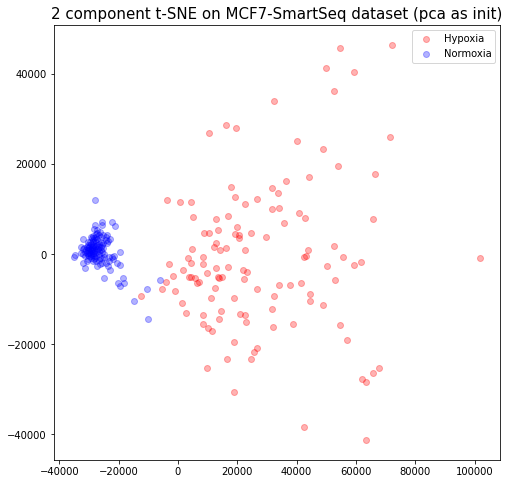

In [ ]:
embedded2 = TSNE(n_components=2, learning_rate='auto', init='pca').fit_transform(data_fifty)

fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.set_title('2 component t-SNE on MCF7-SmartSeq dataset (pca as init)', fontsize = 15)

ax.scatter(embedded2[l_hypoxia,0], embedded2[l_hypoxia,1], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(embedded2[l_normoxia,0], embedded2[l_normoxia,1], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

Indeed, we can observe that this new plot displays a practically perfect match of the PCA plot.

#### UMAP

For a matter of completeness, we now try to implement Uniform Manifold Approximation and Projection. The idea behind this method is similar to t-SNE’s; the significant difference with t-SNE is scalability, it can be applied directly to sparse matrices thereby eliminating the need to applying any Dimensionality reduction such as PCA as a prior pre-processing step.

Let's first install the umap library

In [ ]:
!pip install umap-learn

     |████████████████████████████████| 88 kB 3.0 MB/s 
     |████████████████████████████████| 1.1 MB 40.7 MB/s 
  Created wheel for umap-learn: filename=umap_learn-0.5.3-py3-none-any.whl size=82829 sha256=ce75bd95b80eaa7196e8381fc04923b2f808201bc2b92e7c2a20cc713b4ff08c
  Stored in directory: /root/.cache/pip/wheels/b3/52/a5/1fd9e3e76a7ab34f134c07469cd6f16e27ef3a37aeff1fe821
  Created wheel for pynndescent: filename=pynndescent-0.5.7-py3-none-any.whl size=54286 sha256=f7e687ffcf649d46a44e5827938b3ddca0a60de035d4c051298bef1995aec004
  Stored in directory: /root/.cache/pip/wheels/7f/2a/f8/7bd5dcec71bd5c669f6f574db3113513696b98f3f9b51f496c
Successfully built umap-learn pynndescent


In [ ]:
from umap import UMAP

In [ ]:
reducer = UMAP()

embedding_data = reducer.fit_transform(data.T)
embedding_data.shape

/usr/local/lib/python3.7/dist-packages/numba/np/ufunc/parallel.py:363: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 9107. The TBB threading layer is disabled.
  warnings.warn(problem)


(250, 2)

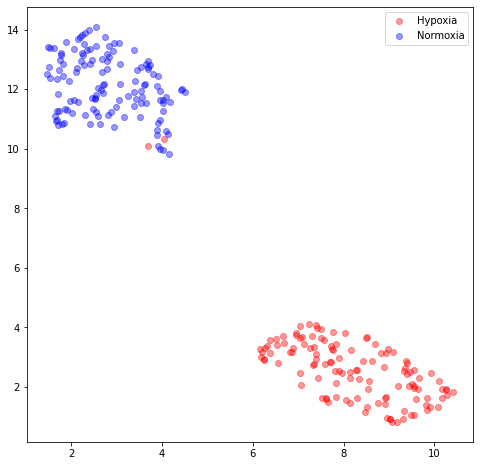

In [ ]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1)

ax.scatter(embedding_data[l_hypoxia, 1], embedding_data[l_hypoxia,0], c="r",alpha = 0.4, label="Hypoxia")
ax.scatter(embedding_data[l_normoxia, 1], embedding_data[l_normoxia,0], c="b",alpha = 0.4, label="Normoxia")
ax.legend()
plt.show()

### Clustering methods

For this first dataframe, we will implement the clustering techniques on the entire dataset, given its reasonably small size.

#### K-means

In this Section we will use the K-Means Algorithm in order to cluster our data.

In [ ]:
from sklearn.cluster import KMeans

In [ ]:
kmeans = KMeans(n_clusters=2, random_state=42)
pred_clus = kmeans.fit_predict(data.T)

In [ ]:
hypo = (pred_clus == 1)
norm = (pred_clus == 0)

We will now plot data using our original labeling againts the labeling obtained through K-Means

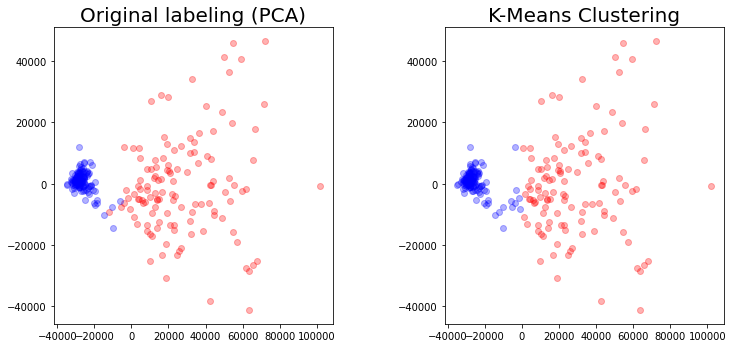

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

Here follow some visualization plots of clustering in both 3D and using decision boundaries with centroids

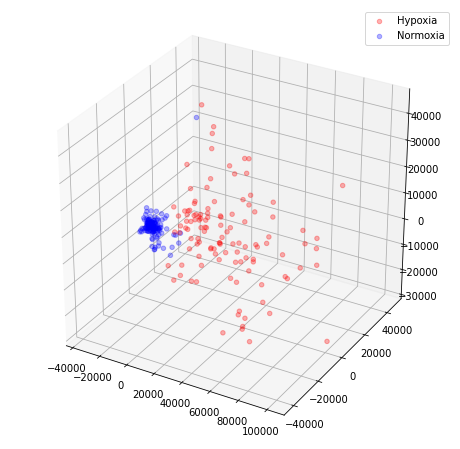

In [ ]:
fig = plt.figure(figsize=(8,8))

ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo,0],data_red[hypo,1], data_red[hypo,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm,0],data_red[norm,1], data_red[norm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

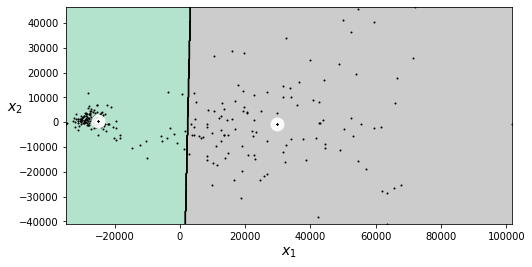

In [ ]:
kmeans.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 4))
plot_decision_boundaries(kmeans, data_red[:, 0:2])
plt.show()pl

The prediction seems quite comparable with the actual labeling.

#### Gaussian mixture

In this part we try to cluster our data using a different technique, namely Gaussian Mixture Method.

In [ ]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=2, random_state=42,
                     covariance_type = "diag")

In [ ]:
pred_mix = gm.fit_predict(data.T)

In [ ]:
hypo_mix = (pred_mix == 1)
norm_mix = (pred_mix == 0)

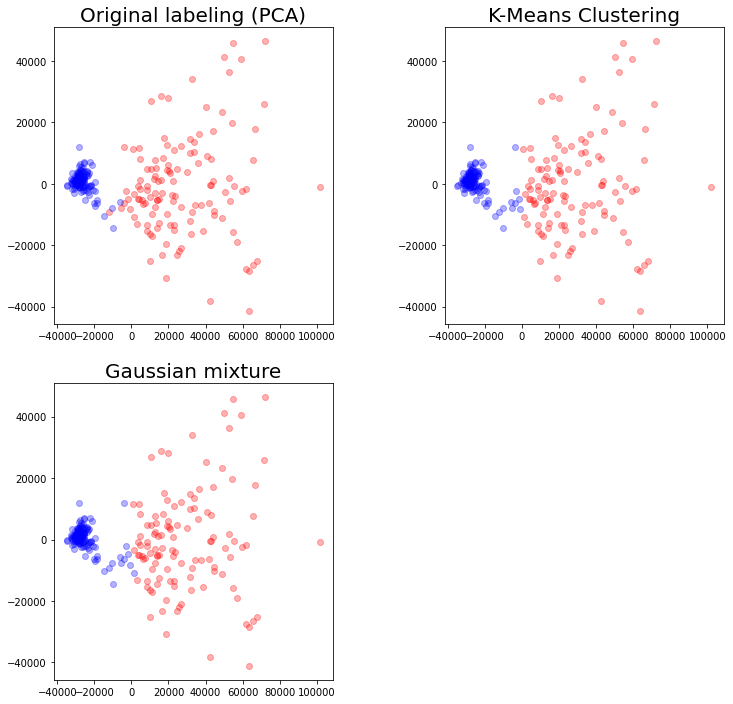

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)


plt.subplots_adjust(wspace=0.4)

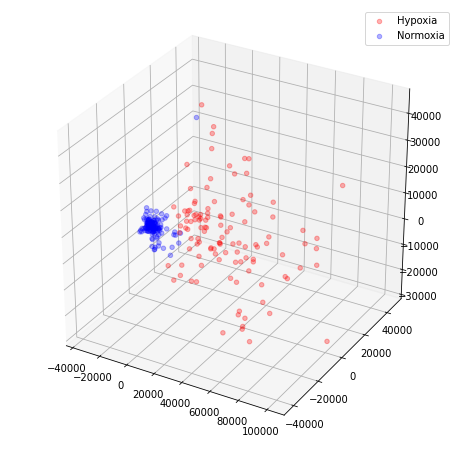

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], data_red[hypo_mix,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_mix,0],data_red[norm_mix,1], data_red[norm_mix,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

In the following cell we plot the decision boundaries of Gaussian Mixture Clustering, which we notice (the red dotted line) being slightly accurate then kmeans.

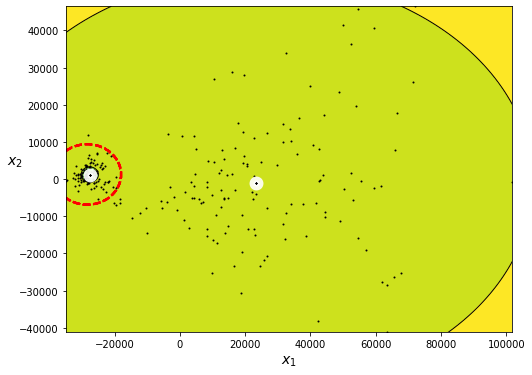

In [ ]:
gm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(gm, data_red[:, 0:2])
plt.show()

#### Bayesian Gaussian Mixture


Here we try to implement a different yet similar method to Gaussian Mixture.

The Bayesian Gaussian Mixture is a method which allows you to not know the exact number of clusters in your data, in a sense it is better because by using a prior it understands how many clusters there should be.

In [ ]:
from sklearn.mixture import BayesianGaussianMixture

In [ ]:
bgm = BayesianGaussianMixture(n_components = 2, random_state = 42)
pred_bgm = bgm.fit_predict(data.T)

In [ ]:
hypo_bgm = (pred_bgm == 1)
norm_bgm = (pred_bgm == 0)

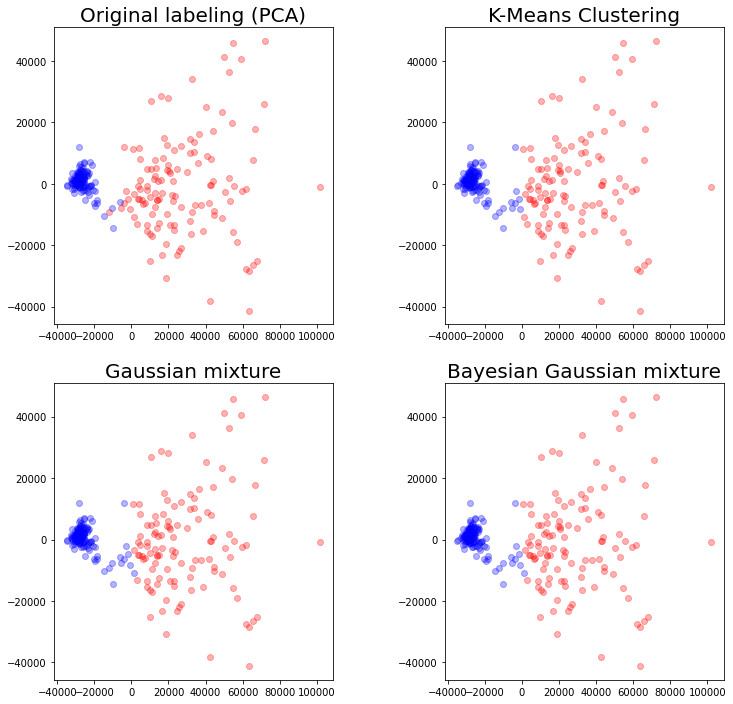

In [ ]:
fig = plt.figure(figsize = (12,12))
ax = fig.add_subplot(2,2,1)
ax1 = fig.add_subplot(2,2,2)
ax2 = fig.add_subplot(2,2,3)
ax3 = fig.add_subplot(2,2,4)

ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], c="b",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

In [ ]:
# bgm.predict_proba(data_red[:, 0:2])

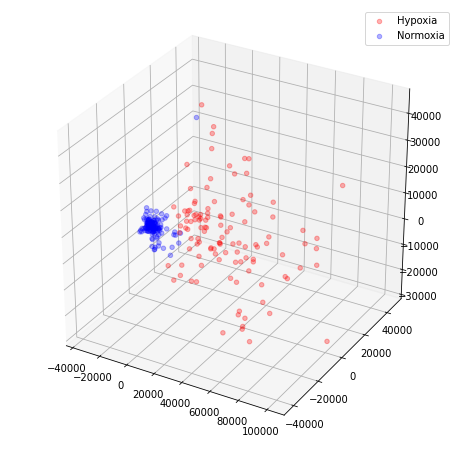

In [ ]:
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='3d')

ax.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], data_red[hypo_bgm,2], c="r",alpha = 0.3, label="Hypoxia")
ax.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], data_red[norm_bgm,2], c="b",alpha = 0.3, label="Normoxia")
ax.legend()

plt.show()

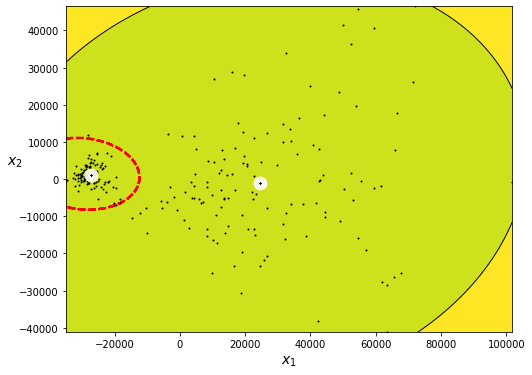

In [ ]:
bgm.fit_predict(data_red[:, 0:2])

plt.figure(figsize=(8, 6))
plot_gaussian_mixture(bgm, data_red[:, 0:2])
plt.show()

#### Agglomerative Clustering

We are also interested on the behavior and performance of hierarchical clustering methods.
In agglomerative algorithms, each item starts in its own cluster, then, objects are recursively clustered by similarity, i.e. the distances between groups, two items at a time. Eventually, all items will be grouped in one cluster.
We choose to implement Agglomerative Clustering, as it is the most commonly used technique of this kind.

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
skA

In [ ]:
pred_aggl = aggl.fit_predict(data_red)

In [ ]:
hypo_aggl = (pred_aggl == 1)
norm_aggl = (pred_aggl == 0)

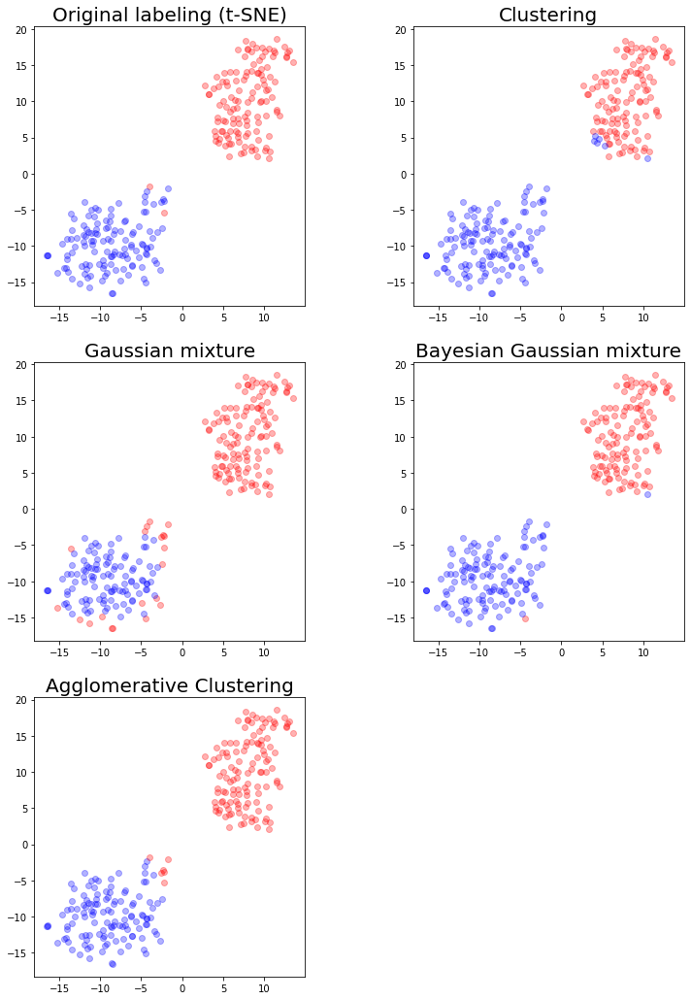

In [ ]:
fig = plt.figure(figsize = (12,18))
ax = fig.add_subplot(3,2,1)
ax1 = fig.add_subplot(3,2,2)
ax2 = fig.add_subplot(3,2,3)
ax3 = fig.add_subplot(3,2,4)
ax4 = fig.add_subplot(3,2,5)

ax.set_title('Original labeling (PCA)', fontsize = 20)

ax1.set_title('K-Means Clustering', fontsize = 20)

ax2.set_title('Gaussian mixture', fontsize = 20)

ax3.set_title('Bayesian Gaussian mixture', fontsize = 20)

ax4.set_title('Agglomerative Clustering', fontsize = 20)

ax.scatter(data_red[l_hypoxia,0],data_red[l_hypoxia,1], c="r",alpha = 0.3)
ax.scatter(data_red[l_normoxia,0],data_red[l_normoxia,1], c="b",alpha = 0.3)

ax1.scatter(data_red[hypo,0],data_red[hypo,1], c="r",alpha = 0.3)
ax1.scatter(data_red[norm,0],data_red[norm,1], c="b",alpha = 0.3)

ax2.scatter(data_red[hypo_mix,0],data_red[hypo_mix,1], c="r",alpha = 0.3)
ax2.scatter(data_red[norm_mix,0],data_red[norm_mix,1], c="b",alpha = 0.3)

ax3.scatter(data_red[hypo_bgm,0],data_red[hypo_bgm,1], c="r",alpha = 0.3)
ax3.scatter(data_red[norm_bgm,0],data_red[norm_bgm,1], c="b",alpha = 0.3)

ax4.scatter(data_red[hypo_aggl,0],data_red[hypo_aggl,1], c="b",alpha = 0.3)
ax4.scatter(data_red[norm_aggl,0],data_red[norm_aggl,1], c="r",alpha = 0.3)

plt.subplots_adjust(wspace=0.4)

This clustering method can be easily visualized in 2D plots known as dendograms, in which the clusters at each step of the algorithm can be clearly displayed. With the following cell, we will try to implement dendograms for each linkage method available for AgglomerativeClustering.

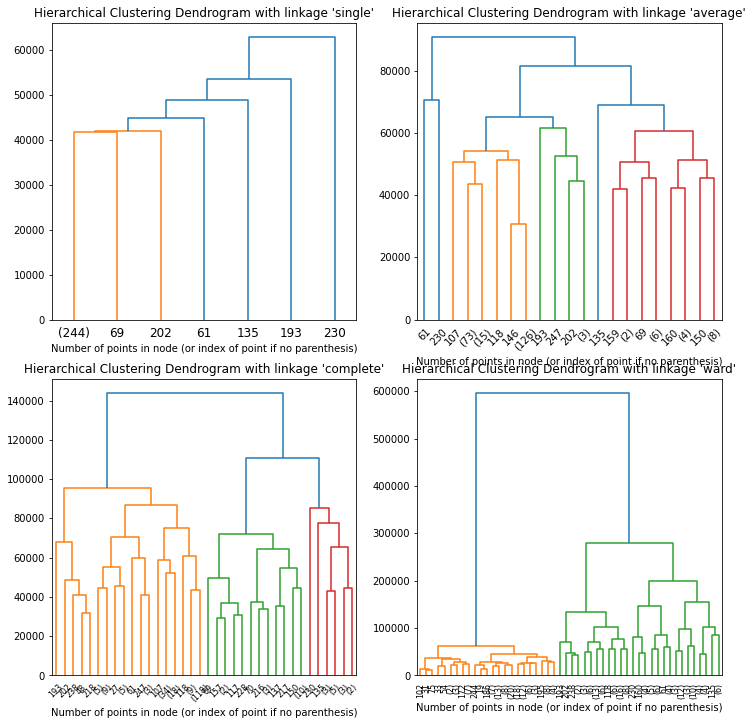

In [ ]:
# setting distance_threshold=0 ensures we compute the full tree.
l_linkage = ['single', 'average', 'complete', 'ward']

fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(12,12))

for n, linkage in enumerate(l_linkage):
    model = AgglomerativeClustering(distance_threshold=0, n_clusters=None, linkage=linkage)
    model = model.fit(data.T)

    ax = plt.subplot(2, 2, n + 1)
    # plot the top five levels of the dendrogram
    plot_dendrogram(model, truncate_mode="level", p=5)
    ax.set_title("Hierarchical Clustering Dendrogram with linkage " + "'" + linkage + "'")
    ax.set_xlabel("Number of points in node (or index of point if no parenthesis)")

plt.show()

#### Evaluating Clustering methods

We will now look at how the various clusterings perform in understanding whether a cell is Hypoxic or not.

In [ ]:
y = []
for i in range(len(l_hypoxia) + len(l_normoxia)):
  if i in l_hypoxia:
    y.append(1)
  elif i in l_normoxia:
    y.append(0)

##### K Means Clustering

In [ ]:
y_pred_clus = kmeans.fit_predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_clus==y))
print("fraction of correct predictions", np.sum(y_pred_clus==y) / len(y_pred_clus))

correct predictions:  243
fraction of correct predictions 0.972


##### Gaussian Mixture

In [ ]:
gm.fit(data.T)
y_pred_mix = gm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_mix==y))
print("fraction of correct predictions", np.sum(y_pred_mix==y) / len(y_pred_mix))

correct predictions:  242
fraction of correct predictions 0.968


##### Bayesian Gaussian Mixture

In [ ]:
bgm.fit(data.T)
y_pred_bgm = bgm.predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_bgm==y))
print("fraction of correct predictions", np.sum(y_pred_bgm==y) / len(y_pred_bgm))

correct predictions:  242
fraction of correct predictions 0.968


##### Agglomerative Clustering

In [ ]:
y_pred_aggl = aggl.fit_predict(data.T)

In [ ]:
print("correct predictions: ", np.sum(y_pred_aggl!=y))
print("fraction of correct predictions", np.sum(y_pred_aggl!=y) / len(y))

correct predictions:  245
fraction of correct predictions 0.98


By observing these results, we can conclude that all clustering methods implemented above, be them Kmeans, GM, or BGM, perform with a significant degree of accuracy on this dataset.

### Classifiers

#### Opening Files

In [ ]:
meta = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_MetaData.tsv', delimiter = "\t", index_col = 0)
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt', delimiter = " ", index_col = 0)
print("data frame dimensions :", np.shape(df))
meta.head()

data frame dimensions : (3000, 250)


,Cell Line,Lane,Pos,Condition,Hours,Cell name,PreprocessingTag,ProcessingComments
Filename,,,,,,,,
output.STAR.1_A10_Hypo_S28_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A10,Hypo,72,S28,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A11_Hypo_S29_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A11,Hypo,72,S29,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A12_Hypo_S30_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A12,Hypo,72,S30,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A1_Norm_S1_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A1,Norm,72,S1,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"
output.STAR.1_A2_Norm_S2_Aligned.sortedByCoord.out.bam,MCF7,output.STAR.1,A2,Norm,72,S2,Aligned.sortedByCoord.out.bam,"STAR,FeatureCounts"


In this section we will test various models for classification of Hypoxic and Normoxic cells. In particular, we will run the following classification models:  

1.   Random Forest
2.   Gradient Boosting
3.   Support Vector Machine

Our goal is to test their performance on a portion of the data which will not be seen by the model during the learning and fitting phase.
In order to tune the main hyperparameters of the models and to select the best parameters, we will run a Grid Search whose size depends on the amount of data we are working with (so we can expect a larger grid for the SmartSeq datasets, which are smaller than the DropSeq datasets).
We will then report the accuracy of the models on the test set and select the best-performing model according to that metric.

As a technical note, the models in the notebook are defined always using the same pipeline, i.e.:

1.   Create and run the classifier with default parameters
2.   Run grid search and find the best parameters
3.   Run the model with the best parameters chosen by grid search and evaluate it.



As a first step, we add a "Condition" column to the original dataset, transposed.
The condition column will contain a 1 if the corresponding line (i.e. the corresponding cell) is Hypoxic and it will contain a 0 if the corresponding cell is Normoxic.

We then use the train_test_split() function to create a train set and a test on which to fit our models and evaluate them.

In [ ]:
from sklearn.model_selection import train_test_split

MC_smart_T = df.T
X = MC_smart_T.to_numpy()

condition = []
for i in list(MC_smart_T.index):
  if "Norm" in i:
    condition.append(0)
  if "Hypo" in i:
    condition.append(1)
MC_smart_T["Condition"] = condition

y = np.array(condition)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

In [ ]:
(X_train.shape, X_test.shape)

((187, 3000), (63, 3000))

####Random Forest

We will implement a Random Forest

In [ ]:
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(criterion = "gini", random_state=42)

# Define the grid of parameters which will be used by GridSearchCV()
p_grid = {'n_estimators': [15, 30, 80, 150, 250],
          'criterion': ["gini", "entropy"],
          'min_samples_leaf': [1, 2]}

gs = GridSearchCV(rfc, param_grid = p_grid).fit(X_train, y_train)
gs.best_params_ # gives the parameters selected by Grid search

{'criterion': 'gini', 'min_samples_leaf': 1, 'n_estimators': 30}

In [ ]:
from  sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Creat a Classifier with the parameters chosen by Grid Search.
rfc = RandomForestClassifier(n_estimators = gs.best_params_['n_estimators'],
                             min_samples_leaf = gs.best_params_['min_samples_leaf'],
                             criterion = gs.best_params_["criterion"],
                             random_state = 42)

#fit the model on the train set
rfc.fit(X_train, y_train)
#create a prediction...
y_pred = rfc.predict(X_test)
#...and test it
accuracy_score(y_pred, y_test)

1.0

##### Visualizing the Random Forest

Visualizing the first n elements of a random forest

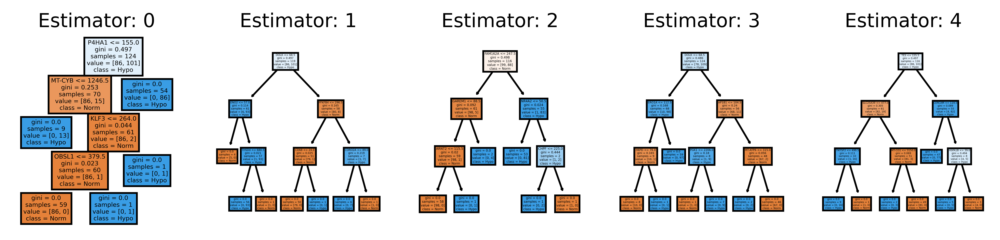

In [ ]:
from sklearn import tree
feature_names = MC_smart_T.columns

fig, axes = plt.subplots(nrows = 1,ncols = 5,figsize = (10,2), dpi=900)
for index in range(0, 5):
    tree.plot_tree(rfc.estimators_[index],
                   feature_names = feature_names,
                   class_names = {0: 'Norm', 1: 'Hypo'},
                   filled = True,
                   ax = axes[index]);

    axes[index].set_title('Estimator: ' + str(index), fontsize = 11)
fig.savefig('rf_5trees.png')

##### Feature Importance

We now want to find a list of the genes that most significantly differ between Normoxic and Hypoxic cells, according to the Random Forest model.

Next we will plot something interesting.

This is the importance of each gene in predicting the right classfication.

The *feature_importances_* looks at the most important features in the model, and understands which are those with the highest appearence frequency when making the splits

In [ ]:
imp = rfc.feature_importances_
q = np.quantile(imp, 0.98)
gene = []
for name, score in zip(list(MC_smart_T.iloc[:,:-1].columns), rfc.feature_importances_):
  if score >= q:
    gene.append((name,score))
#sort the genes in decreasing order of feature importance
gene.sort(key = lambda x : x[1],reverse=True)

#print the names of the genes
genes = [i[0] for i in gene]
for i in genes:
    print(i,end=" ")

genesM = genes

GPI FAM162A P4HA1 MT-CYB ARPC1B DOLK BNIP3 BNIP3L CYP1B1 CRELD2 ENO2 ALDOA DDIT4 NECTIN2 RHOD G6PC3 MT-ATP8 FDFT1 GFRA1 KPNA2 SRM TES IER5L C1QTNF6 ZNF395 OLFM1 SLC25A39 HK2 TST PFKFB4 MTATP6P1 ERO1A RAMP1 QSOX1 TXNRD1 MPV17L2 DUSP10 AP1B1 FTH1 PDZK1 DSP DAPK2 DCXR TMEM255B GAREM1 GPR87 CYB561A3 MT-CO1 RIMKLA PGM1 PDK1 TM7SF2 NEDD9 MECOM QPRT ABHD14A-ACY1 LY6E HSPA1B GATA3 SLC9A3R1-AS1 

In [ ]:
for i in genesH:
  for j in genesM:
    if i == j:
      print(i)


ERO1A
BNIP3
FAM162A
BNIP3L
P4HA1
SRM


We now give this gene list to DAVID database and here below you can find the result

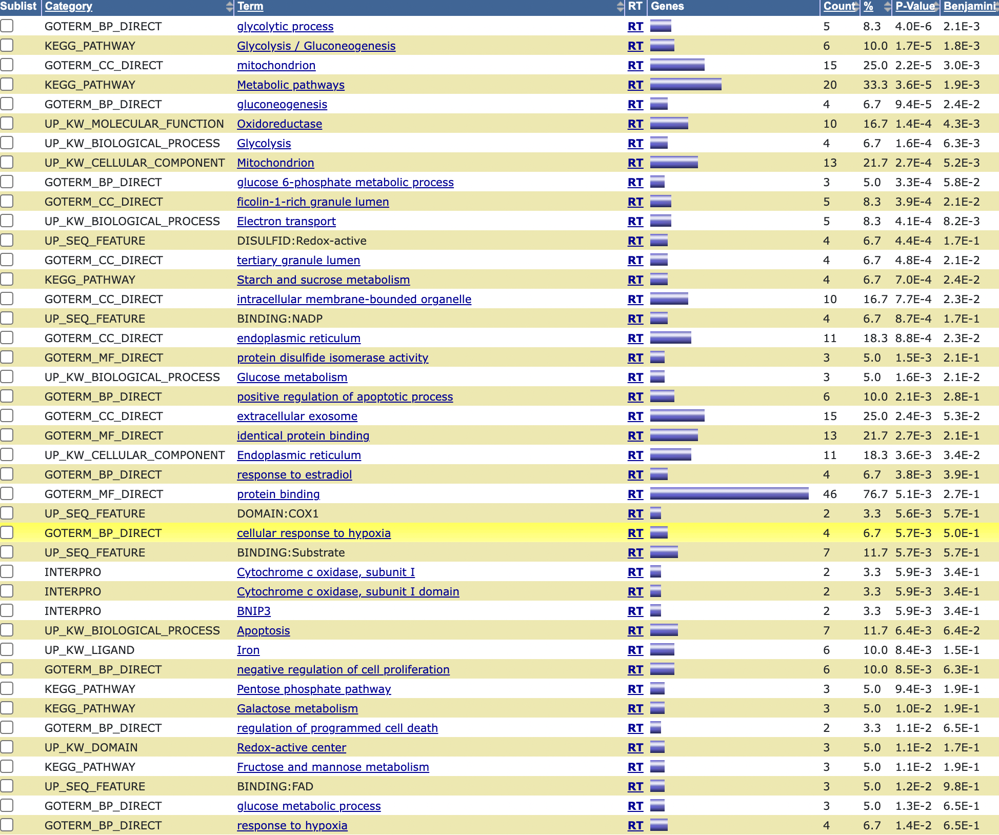

From this image, not to enter in much detail, we can see that from the genes recoverd using feature_importance_ 4 of them can be directly related to "cellular responce to hypoxia", and another 4 of those to "response to hypoxia"

We will now plot just fewer genes for a nicer visualization of their relative feature importance.

<BarContainer object of 27 artists>

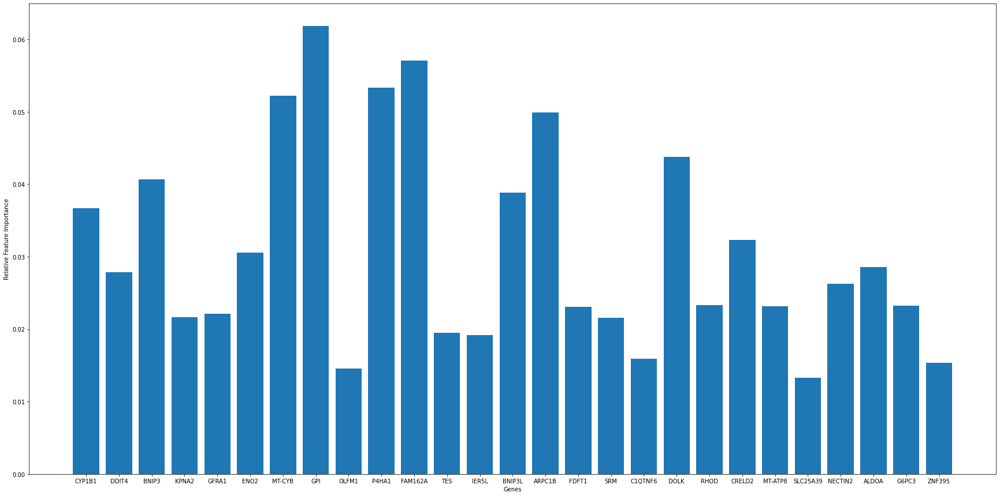

In [ ]:
plt.figure(figsize = (30,15))

g = []
s = []
for name, score in zip(list(MC_smart_T.iloc[:,:-1].columns), rfc.feature_importances_):
  if score >= 0.013:
    g.append(name)
    s.append(score)


plt.xlabel('Genes')
plt.ylabel("Relative Feature Importance")

plt.bar(g, s)

##### Analysing relationship between Principal Components and accuracy


Throughout this section we will perform PCA multiple times each time increasing the number of principal components and in the mean time fitting with the given number of principal components a random forest.

After that we will plot for each dimensione the accuracy reached from each model and compare the results.

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", sep = " ")

In [ ]:
df_meta = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_MetaData.tsv", delimiter = "\t", header=0)

df_meta["Condition"] = df_meta.Condition.eq('Hypo').mul(1)

col_l= []
for j in list(df_train.columns):
    for i , h in zip(df_meta["Filename"], df_meta["Condition"]):
        if j == i:
            col_l.append(h)

<BarContainer object of 19 artists>

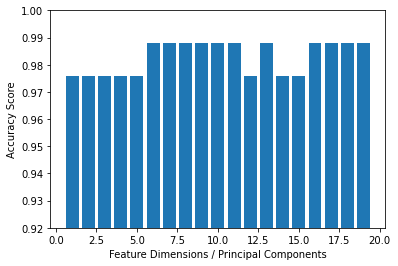

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from  sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
from sklearn.metrics import accuracy_score

acc_list = []
dim_list = [i for i in range(1, 20)]
for i in range(1, 20):

  #PCA
  X = df_train.to_numpy()
  X_t = np.transpose(X)
  pca = PCA(n_components = i)
  Xred = pca.fit_transform(X_t)
  df_red = pd.DataFrame(Xred)

  #Creating the classification framework
  df_red["Classification"] = col_l

  X = df_red.iloc[:,:-1]
  y = df_red["Classification"]

  X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state = 42)

  #Fitting the random forest
  rfc = RandomForestClassifier(n_estimators = 100,
                               min_samples_leaf = 1,
                               min_samples_split = 2,
                               criterion="gini", random_state = 42)

  rfc.fit(X_train, y_train)
  y_pred = rfc.predict(X_test)
  acc_list.append(accuracy_score(y_pred, y_test))


#plotting the accuracy scores
plt.xlabel("Feature Dimensions / Principal Components")
plt.ylabel("Accuracy Score")
plt.ylim([0.92, 1])

plt.bar(dim_list, acc_list)

From the bar chart above we can easily see that our random forest easily reaches high levels of accuracy even with few principal components, i.e. with less information

####Gradient Boosting

Here we will use another type of classifier, Gradient Boosting.

We will firstly perform a grid search over some of the parameters of our model.

In [ ]:
from sklearn.model_selection import train_test_split

MC_smart_T = df.T
X = MC_smart_T.to_numpy()

condition = []
for i in list(MC_smart_T.index):
  if "Norm" in i:
    condition.append(0)
  if "Hypo" in i:
    condition.append(1)
MC_smart_T["Condition"] = condition

y = np.array(condition)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

In [ ]:
(X_train.shape, X_test.shape)

((187, 3000), (63, 3000))

In [ ]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((167, 3000), (83, 3000))

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

gb_clf = GradientBoostingClassifier(random_state = 42)

p_grid = {'max_features' : [5, 10, 25, 40],
          'max_leaf_nodes' : [2, 4, 8, 16],
          'n_estimators' : [20, 40, 60, 80, 100, 150, 200]}

gs = GridSearchCV(gb_clf, param_grid = p_grid).fit(X_train, y_train)
gs.best_params_

{'max_features': 25, 'max_leaf_nodes': 2, 'n_estimators': 150}

In [ ]:
gb_clf = GradientBoostingClassifier(learning_rate = 0.1,
                                    max_features = gs.best_params_['max_features'],
                                    max_leaf_nodes = gs.best_params_['max_leaf_nodes'],
                                    n_estimators = gs.best_params_['n_estimators'])

gb_clf.fit(X_train, y_train)
y_pred = gb_clf.predict(X_test)
accuracy_score(y_pred, y_test)

1.0

####SVM

Yet again a different classifier, SVM and also here we will perform some cross validation to tune the hyperparameters

In [ ]:
from sklearn.model_selection import train_test_split

MC_smart_T = df.T
X = MC_smart_T.to_numpy()

condition = []
for i in list(MC_smart_T.index):
  if "Norm" in i:
    condition.append(0)
  if "Hypo" in i:
    condition.append(1)
MC_smart_T["Condition"] = condition

y = np.array(condition)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

In [ ]:
(X_train.shape, X_test.shape, y_train.shape, y_test.shape)

((167, 3000), (83, 3000), (167,), (83,))

In [ ]:
from sklearn.svm import SVC

svc = SVC()
parameters = {'kernel': ['linear', 'rbf', 'poly', 'sigmoid'],
              'C': [0.5, 1, 1.5, 2, 4, 6, 10],
              'gamma': ['scale', 'auto'],
              'degree': [2, 3, 4]}

clf = GridSearchCV(svc, parameters).fit(X_train, y_train)
clf.best_params_

{'C': 1, 'degree': 2, 'gamma': 'scale', 'kernel': 'poly'}

In [ ]:
svc = SVC(C=clf.best_params_["C"],
          kernel=clf.best_params_["kernel"],
          gamma=clf.best_params_["gamma"],
          degree=clf.best_params_["degree"])

svc.fit(X_train, y_train)
y_pred = svc.predict(X_test)
accuracy_score(y_pred, y_test)

0.9759036144578314

#### Soft-Voting Classifer

Implementing an important ensembeling method technique which will allow us to see the performances of different classifiers.

In [ ]:
from sklearn.model_selection import train_test_split

MC_smart_T = df.T
X = MC_smart_T.to_numpy()

condition = []
for i in list(MC_smart_T.index):
  if "Norm" in i:
    condition.append(0)
  if "Hypo" in i:
    condition.append(1)
MC_smart_T["Condition"] = condition

y = np.array(condition)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state = 42)

In [ ]:
from sklearn.ensemble import VotingClassifier, RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC

from sklearn.metrics import accuracy_score

log_clf = LogisticRegression(solver="lbfgs", random_state=42)
rnd_clf = RandomForestClassifier(n_estimators=100, random_state=42)
svm_clf = SVC(gamma="scale", probability=True, random_state=42) # whatch out for the variable probabilty

vot_clf = VotingClassifier([('lr', log_clf), ('rf', rnd_clf), ('svc', svm_clf)],
                           voting = 'soft')


for clf in (log_clf, rnd_clf, svm_clf, vot_clf):
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    print(clf.__class__.__name__, accuracy_score(y_test, y_pred))

LogisticRegression 1.0
RandomForestClassifier 1.0
SVC 0.9841269841269841
VotingClassifier 1.0


#### Neural Network

Throughout this section we will be implementing a Multi-Layer Perceptron using Keras a Tensorflow library.

$$                             $$

Import libraries and packages first

In [ ]:
import pandas as pd
import numpy as np
import matplotlib
import os
import sklearn
%matplotlib inline
import matplotlib as mpl
import matplotlib.pyplot as plt
from keras.models import Sequential
from keras.layers import Dense

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Python ≥3.5
import sys
assert sys.version_info >= (3, 5)

# Scikit-Learn ≥0.20
import sklearn
assert sklearn.__version__ >= "0.20"

try:
    # %tensorflow_version only exists in Colab.
    %tensorflow_version 2.x
except Exception:
    pass

# TensorFlow ≥2.0
import tensorflow as tf
assert tf.__version__ >= "2.0"

# Common imports
import numpy as np
import os



Import Keras and Tensor Flow


In [ ]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Input, Flatten

In [ ]:
tf.__version__

'2.8.0'

In [ ]:
keras.__version__

'2.8.0'

Build correctly the data set on which we will construct our NN

We now import our dataset. After that, we construct a column indicating if the respective cell presents an hypoxia or normoxia condition

In [ ]:
df_meta = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_MetaData.tsv", delimiter = "\t", header=0)

In [ ]:
df_test = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_test_anonim.txt", sep = ' ')
df_test_t = df_test.T

In [ ]:
df_train = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AILAB/MCF7_SmartS_Filtered_Normalised_3000_Data_train.txt", sep = " ")

In [ ]:
df_meta["Condition"] = df_meta.Condition.eq('Hypo').mul(1)

In [ ]:
col_l= []
for j in list(df_train.columns):
    for i , h in zip(df_meta["Filename"], df_meta["Condition"]):
        if j == i:
            col_l.append(h)


In [ ]:
X = df_train.to_numpy()
X_t = np.transpose(X)

In [ ]:
df_red = pd.DataFrame(X_t)

In [ ]:
df_red["Classification"] = col_l

In [ ]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split

X = df_red.iloc[:,:-1]
y = df_red["Classification"]



For the purpouse of creating our classifier, we now divide our dataset in training and test set. We retain a part of the dataset to be used just for testing and not also for validation to avoid overfitting

In [ ]:
x_trainF, x_test, y_trainF, y_test = train_test_split(X, y, test_size=0.23, random_state=42)


In [ ]:
x_valid, x_train = x_trainF[:100], x_trainF[100:]
y_valid, y_train = y_trainF[:100], y_trainF[100:]

We now construct our MLP, using a pyramidal architecture. We found that it is the more effective way on how we can costruct our NN for this dataset

In [ ]:
model=Sequential()

In [ ]:
model.add(Dense(units= 512, activation= "relu", input_shape= (3000,)))
model.add(Dense(units= 256, activation= "relu"))
model.add(Dense(units= 128, activation= "relu"))
model.add(Dense(units= 128, activation= "relu"))
model.add(Dense(units= 128, activation= "relu"))
model.add(Dense(units= 64, activation= "relu"))
model.add(Dense(units= 1,activation = 'sigmoid'))


In [ ]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer=keras.optimizers.Adam(learning_rate=0.0001, decay = 0.1),
              metrics=['accuracy'])

In [ ]:
hist=model.fit(x = x_train, y = y_train, epochs=20, validation_data = (x_valid,y_valid))

Epoch 1/20


/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


3/3 [==============================] - 1s 142ms/step - loss: 47.0355 - accuracy: 0.5435 - val_loss: 5.5269 - val_accuracy: 0.7900
Epoch 2/20
1/3 [=========>....................] - ETA: 0s - loss: 6.6702 - accuracy: 0.8125

/usr/local/lib/python3.7/dist-packages/tensorflow/python/util/dispatch.py:1082: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a sigmoid or softmax activation and thus does not represent logits. Was this intended?"
  return dispatch_target(*args, **kwargs)


3/3 [==============================] - 0s 60ms/step - loss: 9.8007 - accuracy: 0.8043 - val_loss: 0.8538 - val_accuracy: 0.9500
Epoch 3/20
3/3 [==============================] - 0s 39ms/step - loss: 2.1551 - accuracy: 0.9565 - val_loss: 0.1821 - val_accuracy: 0.9900
Epoch 4/20
3/3 [==============================] - 0s 37ms/step - loss: 0.7929 - accuracy: 0.9891 - val_loss: 0.2976 - val_accuracy: 0.9900
Epoch 5/20
3/3 [==============================] - 0s 39ms/step - loss: 0.3914 - accuracy: 0.9891 - val_loss: 0.3906 - val_accuracy: 0.9800
Epoch 6/20
3/3 [==============================] - 0s 57ms/step - loss: 0.1613 - accuracy: 0.9891 - val_loss: 0.5163 - val_accuracy: 0.9700
Epoch 7/20
3/3 [==============================] - 0s 40ms/step - loss: 0.0070 - accuracy: 1.0000 - val_loss: 0.6656 - val_accuracy: 0.9700
Epoch 8/20
3/3 [==============================] - 0s 58ms/step - loss: 0.0113 - accuracy: 0.9891 - val_loss: 0.7522 - val_accuracy: 0.9700
Epoch 9/20
3/3 [======================

In [ ]:
model.evaluate(x_test, y_test)

2/2 [==============================] - 0s 10ms/step - loss: 4.4379e-12 - accuracy: 1.0000


[4.437930491846265e-12, 1.0]

With an accurate choice on how we construct our MLP, we obtain a 100% accuracy on the test set, confirming the fact that we were not overfitting

Saving figure keras_learning_curves_plot


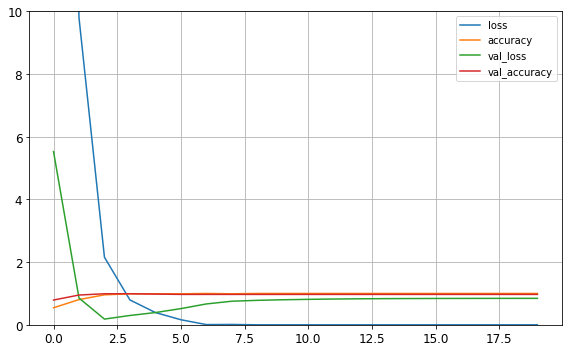

In [ ]:
import pandas as pd

pd.DataFrame(hist.history).plot(figsize=(8, 5))
plt.grid(True)
plt.gca().set_ylim(0, 10)
save_fig("keras_learning_curves_plot")
plt.show()

As we notice from above, we have plotted the accuracy and the loss on the training and validation set. We actually obtain a very smooth function: nice!


